In [1]:
import pandas as pd
import numpy as np

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
df = pd.read_excel('/content/drive/Shareddrives/Spark! and Sustainable Purchasing/Department Mason spend.xlsx')
df = df.drop(columns=['Without\nPurchase Order', 'Unnamed: 19', 'Unnamed: 20']).dropna()

In [ ]:
df

,ARAVO Vendor ID,Vendor,Vendor Name,Type of Business,PO Creation Date,Product P/N (Vendor),Shopper,Unit,Unit name,With \nPurchase Order,Total Invoice \nAmount,Total Paid,Disc. Amount,Total Invoice \nQty,match,upper part,Category,Description
0,10572031.0,10000800.0,WB Mason Company,OFFICE SUPPLIES & COMMERCIAL S,2016-01-06,GMT6505,TIARAT,ZBU_ORG_U102,ADMINISTRATIVE SERVICES,19.68,19.68,19.68,0.39,2,1071.0,GMT6505,Coffee,"C-66920349|5853096957|Tea K-Cups Sampler, Asso..."
1,10572031.0,10000800.0,WB Mason Company,OFFICE SUPPLIES & COMMERCIAL S,2016-01-06,NES35110BX,TIARAT,ZBU_ORG_U102,ADMINISTRATIVE SERVICES,8.94,8.94,8.94,0.18,3,1223.0,NES35110BX,Coffee,"Original Liquid Coffee Creamer, 0.38 oz. Singl..."
2,10572031.0,10000800.0,WB Mason Company,OFFICE SUPPLIES & COMMERCIAL S,2016-01-11,GMT4050,MIKEJD,ZBU_ORG_U151,INFORMATION SERVICES & TECHNOLOGY,10.32,10.32,10.32,0.21,1,1017.0,GMT4050,Coffee,"Newman's Special Blend K-Cup Pods, 24/BX"
3,10572031.0,10000800.0,WB Mason Company,OFFICE SUPPLIES & COMMERCIAL S,2016-01-11,ITD102042,MLMORRIS,ZBU_ORG_U151,INFORMATION SERVICES & TECHNOLOGY,28.52,28.52,28.52,0.57,4,1260.0,ITD102042,Coffee,"Half AND Half Liquid Coffee Creamer, 0.3 oz. S..."
4,10572031.0,10000800.0,WB Mason Company,OFFICE SUPPLIES & COMMERCIAL S,2016-01-12,HEWC9731A,AMACKIN,ZBU_ORG_U151,INFORMATION SERVICES & TECHNOLOGY,195.57,195.57,195.57,0.00,1,590.0,HEWC9731A,Toner,"C-63961931|5840488845|645A, (C9731A) Cyan Orig..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61047,10572031.0,10000800.0,WB Mason Company,OFFICE SUPPLIES & COMMERCIAL S,2020-06-04,GMT6003,ADASILVA,ZBU_ORG_U186,CRC FACILITIES MANAGEMENT & PLANNING,43.52,43.52,43.52,0.00,4,980.0,GMT6003,Coffee,"Colombian Coffee K-Cup Pods, 24/BX"
61048,10572031.0,10000800.0,WB Mason Company,OFFICE SUPPLIES & COMMERCIAL S,2020-06-04,GMT6520,ADASILVA,ZBU_ORG_U186,CRC FACILITIES MANAGEMENT & PLANNING,43.52,43.52,43.52,0.00,4,1012.0,GMT6520,Coffee,"Breakfast Blend Coffee K-Cup Pods, 24/BX"
61049,10572031.0,10000800.0,WB Mason Company,OFFICE SUPPLIES & COMMERCIAL S,2020-06-04,GMT6570,ADASILVA,ZBU_ORG_U186,CRC FACILITIES MANAGEMENT & PLANNING,43.52,43.52,43.52,0.00,4,1004.0,GMT6570,Coffee,"Our Blend Coffee K-Cup Pods, 24/BX"
61050,10572031.0,10000800.0,WB Mason Company,OFFICE SUPPLIES & COMMERCIAL S,2020-06-04,GMT6663,ADASILVA,ZBU_ORG_U186,CRC FACILITIES MANAGEMENT & PLANNING,65.28,65.28,65.28,0.00,6,976.0,GMT6663,Coffee,"Nantucket Blend Coffee K-Cup Pods, 24/BX, 4 BX/CT"


In [ ]:
df.describe()

,ARAVO Vendor ID,Vendor,With \nPurchase Order,Total Invoice \nAmount,Total Paid,Disc. Amount,match
count,61049.0,61049.0,61049.000000,61049.000000,61049.000000,61049.000000,61049.000000
mean,10572031.0,10000800.0,50.183581,50.183581,50.180256,0.754073,896.264214
std,0.0,0.0,84.050265,84.050265,84.053059,1.468556,355.141286
min,10572031.0,10000800.0,-377.820000,-377.820000,-377.820000,-7.890000,1.000000
25%,10572031.0,10000800.0,10.880000,10.880000,10.880000,0.070000,930.000000
50%,10572031.0,10000800.0,22.540000,22.540000,22.540000,0.290000,1004.000000
75%,10572031.0,10000800.0,55.920000,55.920000,55.920000,0.830000,1079.000000
max,10572031.0,10000800.0,3655.840000,3655.840000,3655.840000,73.120000,1546.000000


In [ ]:
df['Unit name'].unique()

array(['ADMINISTRATIVE SERVICES', 'INFORMATION SERVICES & TECHNOLOGY',
       'SCHOOL OF MEDICINE (BUSM)', 'THE BU ACADEMY',
       'GENERAL ED SUPPORT & ACADEMIC INITIATIVS',
       'BUMC FACILITIES MANAGEMENT',
       'HENRY M GOLDMAN SCH OF DENTAL MED (GSDM)',
       'PHYSICAL DEVELOPMENT PROGRAMS & ATHLETIC', 'PROVOST',
       'QUESTROM SCHOOL OF BUSINESS (QST)',
       'COLLEGE OF ARTS AND SCIS (CAS)', 'CENTRAL ADMINISTRATION',
       'GLOBAL PROGRAMS', 'MET & EXTENDED EDUCATION ADMINISTRATION',
       'VICE PRESIDENT FINANCE', 'COLLEGE OF ENGINEERING (ENG)',
       'DEVELOPMENT & ALUMNI RELATIONS', 'METROPOLITAN COLLEGE (MET)',
       'NATL EMERGING INFECTIOUS DIS LAB (NEIDL)',
       'ENROLLMENT & STUDENT AFFAIRS', 'SDM DENTAL CLINICS',
       'SARGENT COLLEGE OF HEALTH & REHAB. SCI.',
       'SCHOOL OF PUBLIC HEALTH (SPH)', 'UNIV PROFESSORS-HONORS COLLEGE',
       'CRC FACILITIES MANAGEMENT & PLANNING',
       'COLLEGE OF FINE ARTS (CFA)', 'GRADUATE MEDICAL SCIENCES (GMS)',
   

In [ ]:
print(df['Unit name'].unique().size)

59


In [ ]:
# Total requests for different apartment
df['Unit name'].value_counts()

SCHOOL OF MEDICINE (BUSM)                   6616
HENRY M GOLDMAN SCH OF DENTAL MED (GSDM)    5722
COLLEGE OF ARTS AND SCIS (CAS)              5421
GENERAL ED SUPPORT & ACADEMIC INITIATIVS    3611
SCHOOL OF PUBLIC HEALTH (SPH)               2538
ADMINISTRATIVE SERVICES                     2200
INFORMATION SERVICES & TECHNOLOGY           1973
METROPOLITAN COLLEGE (MET)                  1757
ENROLLMENT & STUDENT AFFAIRS                1590
SCHOOL OF LAW (LAW)                         1572
COLLEGE OF ENGINEERING (ENG)                1533
CRC FACILITIES MANAGEMENT & PLANNING        1521
SARGENT COLLEGE OF HEALTH & REHAB. SCI.     1511
VICE PRESIDENT FINANCE                      1506
ACADEMIC INSTITUTES & CENTERS               1450
QUESTROM SCHOOL OF BUSINESS (QST)           1349
PROVOST                                     1299
PHYSICAL DEVELOPMENT PROGRAMS & ATHLETIC    1262
GRADUATE MEDICAL SCIENCES (GMS)             1101
COLLEGE OF FINE ARTS (CFA)                  1095
MEDICAL CAMPUS ADMIN

In [4]:
coffee_req, toner_req = df[df.Category=='Coffee'], df[df.Category=='Toner']

In [5]:
df.rename(columns={'PO Creation Date':'Date'}, inplace=True)


In [ ]:
import datetime
s_date = datetime.datetime.strptime('20160101', '%Y%m%d')
e_date = datetime.datetime.strptime('20161231', '%Y%m%d')
y2016_req = df[(df['Date']>=s_date) & (df['Date'] <= e_date) & (df.Category=='Coffee')]

s_date2 = datetime.datetime.strptime('20170101', '%Y%m%d')
e_date2 = datetime.datetime.strptime('20171231', '%Y%m%d')
y2017_req = df[(df['Date']>=s_date2) & (df['Date'] <= e_date2) & (df.Category=='Coffee')]

s_date3 = datetime.datetime.strptime('20180101', '%Y%m%d')
e_date3 = datetime.datetime.strptime('20181231', '%Y%m%d')
y2018_req = df[(df['Date']>=s_date3) & (df['Date'] <= e_date3)& (df.Category=='Coffee')]

s_date4 = datetime.datetime.strptime('20190101', '%Y%m%d')
e_date4 = datetime.datetime.strptime('20191231', '%Y%m%d')
y2019_req = df[(df['Date']>=s_date4) & (df['Date'] <= e_date4)& (df.Category=='Coffee')]

s_date5 = datetime.datetime.strptime('20200101', '%Y%m%d')
e_date5 = datetime.datetime.strptime('20201231', '%Y%m%d')
y2020_req = df[(df['Date']>=s_date5) & (df['Date'] <= e_date5)& (df.Category=='Coffee')]

In [ ]:
y2020_req['Unit name'].value_counts()

HENRY M GOLDMAN SCH OF DENTAL MED (GSDM)    248
SCHOOL OF MEDICINE (BUSM)                   218
GENERAL ED SUPPORT & ACADEMIC INITIATIVS    216
CRC FACILITIES MANAGEMENT & PLANNING        161
COLLEGE OF ARTS AND SCIS (CAS)              157
ADMINISTRATIVE SERVICES                      92
NBL ACADEMIC PLANT                           85
SCHOOL OF LAW (LAW)                          83
COLLEGE OF ENGINEERING (ENG)                 83
ENROLLMENT & STUDENT AFFAIRS                 83
SCHOOL OF PUBLIC HEALTH (SPH)                82
VICE PRESIDENT FINANCE                       79
PROVOST                                      79
ACADEMIC INSTITUTES & CENTERS                72
METROPOLITAN COLLEGE (MET)                   69
INFORMATION SERVICES & TECHNOLOGY            62
PHYSICAL DEVELOPMENT PROGRAMS & ATHLETIC     59
QUESTROM SCHOOL OF BUSINESS (QST)            50
MEDICAL CAMPUS ADMINISTRATION (BUMC)         50
COLLEGE OF FINE ARTS (CFA)                   46
STUDENT HEALTH SERVICES                 

In [ ]:
y2019_req['Unit name'].value_counts()

HENRY M GOLDMAN SCH OF DENTAL MED (GSDM)    895
SCHOOL OF MEDICINE (BUSM)                   843
COLLEGE OF ARTS AND SCIS (CAS)              752
GENERAL ED SUPPORT & ACADEMIC INITIATIVS    674
ADMINISTRATIVE SERVICES                     478
ENROLLMENT & STUDENT AFFAIRS                442
SCHOOL OF PUBLIC HEALTH (SPH)               391
VICE PRESIDENT FINANCE                      359
METROPOLITAN COLLEGE (MET)                  354
PROVOST                                     327
COLLEGE OF ENGINEERING (ENG)                319
ACADEMIC INSTITUTES & CENTERS               308
INFORMATION SERVICES & TECHNOLOGY           280
SCHOOL OF LAW (LAW)                         275
SARGENT COLLEGE OF HEALTH & REHAB. SCI.     259
CRC FACILITIES MANAGEMENT & PLANNING        258
PHYSICAL DEVELOPMENT PROGRAMS & ATHLETIC    215
QUESTROM SCHOOL OF BUSINESS (QST)           205
MEDICAL CAMPUS ADMINISTRATION (BUMC)        184
STUDENT LIFE                                157
UNIVERSITY LIBRARIES                    

In [ ]:
y2018_req['Unit name'].value_counts()

HENRY M GOLDMAN SCH OF DENTAL MED (GSDM)    965
SCHOOL OF MEDICINE (BUSM)                   897
COLLEGE OF ARTS AND SCIS (CAS)              895
INFORMATION SERVICES & TECHNOLOGY           600
GENERAL ED SUPPORT & ACADEMIC INITIATIVS    579
ADMINISTRATIVE SERVICES                     503
ENROLLMENT & STUDENT AFFAIRS                421
ACADEMIC INSTITUTES & CENTERS               399
SCHOOL OF PUBLIC HEALTH (SPH)               375
METROPOLITAN COLLEGE (MET)                  372
CRC FACILITIES MANAGEMENT & PLANNING        345
SARGENT COLLEGE OF HEALTH & REHAB. SCI.     334
PROVOST                                     311
UNIV PROFESSORS-HONORS COLLEGE              289
SCHOOL OF LAW (LAW)                         278
VICE PRESIDENT FINANCE                      274
COLLEGE OF ENGINEERING (ENG)                272
PHYSICAL DEVELOPMENT PROGRAMS & ATHLETIC    257
QUESTROM SCHOOL OF BUSINESS (QST)           209
UNIVERSITY LIBRARIES                        199
GLOBAL PROGRAMS                         

In [ ]:
y2017_req['Unit name'].value_counts()

HENRY M GOLDMAN SCH OF DENTAL MED (GSDM)    992
SCHOOL OF MEDICINE (BUSM)                   939
COLLEGE OF ARTS AND SCIS (CAS)              835
GENERAL ED SUPPORT & ACADEMIC INITIATIVS    636
INFORMATION SERVICES & TECHNOLOGY           515
ADMINISTRATIVE SERVICES                     470
SCHOOL OF PUBLIC HEALTH (SPH)               452
METROPOLITAN COLLEGE (MET)                  371
CRC FACILITIES MANAGEMENT & PLANNING        341
VICE PRESIDENT FINANCE                      324
ENROLLMENT & STUDENT AFFAIRS                319
PROVOST                                     288
SCHOOL OF LAW (LAW)                         288
GRADUATE MEDICAL SCIENCES (GMS)             280
QUESTROM SCHOOL OF BUSINESS (QST)           279
SARGENT COLLEGE OF HEALTH & REHAB. SCI.     266
ACADEMIC INSTITUTES & CENTERS               263
PHYSICAL DEVELOPMENT PROGRAMS & ATHLETIC    262
UNIV PROFESSORS-HONORS COLLEGE              259
COLLEGE OF FINE ARTS (CFA)                  202
UNIVERSITY LIBRARIES                    

In [ ]:
y2016_req['Unit name'].value_counts()

HENRY M GOLDMAN SCH OF DENTAL MED (GSDM)    963
SCHOOL OF MEDICINE (BUSM)                   825
COLLEGE OF ARTS AND SCIS (CAS)              727
GENERAL ED SUPPORT & ACADEMIC INITIATIVS    591
ADMINISTRATIVE SERVICES                     471
SCHOOL OF PUBLIC HEALTH (SPH)               469
INFORMATION SERVICES & TECHNOLOGY           355
VICE PRESIDENT FINANCE                      349
METROPOLITAN COLLEGE (MET)                  346
GRADUATE MEDICAL SCIENCES (GMS)             315
ENROLLMENT & STUDENT AFFAIRS                293
CRC FACILITIES MANAGEMENT & PLANNING        255
PHYSICAL DEVELOPMENT PROGRAMS & ATHLETIC    249
QUESTROM SCHOOL OF BUSINESS (QST)           241
SCHOOL OF LAW (LAW)                         230
SARGENT COLLEGE OF HEALTH & REHAB. SCI.     213
ACADEMIC INSTITUTES & CENTERS               205
UNIV PROFESSORS-HONORS COLLEGE              192
MEDICAL CAMPUS ADMINISTRATION (BUMC)        187
SDM DENTAL CLINICS                          169
PROVOST                                 

In [6]:
coffee_req['Unit name'].value_counts()

HENRY M GOLDMAN SCH OF DENTAL MED (GSDM)    4063
SCHOOL OF MEDICINE (BUSM)                   3722
COLLEGE OF ARTS AND SCIS (CAS)              3366
GENERAL ED SUPPORT & ACADEMIC INITIATIVS    2696
ADMINISTRATIVE SERVICES                     2014
INFORMATION SERVICES & TECHNOLOGY           1812
SCHOOL OF PUBLIC HEALTH (SPH)               1769
ENROLLMENT & STUDENT AFFAIRS                1558
METROPOLITAN COLLEGE (MET)                  1512
VICE PRESIDENT FINANCE                      1385
CRC FACILITIES MANAGEMENT & PLANNING        1360
ACADEMIC INSTITUTES & CENTERS               1247
PROVOST                                     1161
SCHOOL OF LAW (LAW)                         1154
SARGENT COLLEGE OF HEALTH & REHAB. SCI.     1107
PHYSICAL DEVELOPMENT PROGRAMS & ATHLETIC    1042
QUESTROM SCHOOL OF BUSINESS (QST)            984
COLLEGE OF ENGINEERING (ENG)                 956
GRADUATE MEDICAL SCIENCES (GMS)              916
UNIV PROFESSORS-HONORS COLLEGE               805
MEDICAL CAMPUS ADMIN

In [ ]:
print(coffee_req['Unit name'].value_counts().size)

56


In [ ]:
coffee_req['Unit name'].value_counts()

HENRY M GOLDMAN SCH OF DENTAL MED (GSDM)    4063
SCHOOL OF MEDICINE (BUSM)                   3722
COLLEGE OF ARTS AND SCIS (CAS)              3366
GENERAL ED SUPPORT & ACADEMIC INITIATIVS    2696
ADMINISTRATIVE SERVICES                     2014
INFORMATION SERVICES & TECHNOLOGY           1812
SCHOOL OF PUBLIC HEALTH (SPH)               1769
ENROLLMENT & STUDENT AFFAIRS                1558
METROPOLITAN COLLEGE (MET)                  1512
VICE PRESIDENT FINANCE                      1385
CRC FACILITIES MANAGEMENT & PLANNING        1360
ACADEMIC INSTITUTES & CENTERS               1247
PROVOST                                     1161
SCHOOL OF LAW (LAW)                         1154
SARGENT COLLEGE OF HEALTH & REHAB. SCI.     1107
PHYSICAL DEVELOPMENT PROGRAMS & ATHLETIC    1042
QUESTROM SCHOOL OF BUSINESS (QST)            984
COLLEGE OF ENGINEERING (ENG)                 956
GRADUATE MEDICAL SCIENCES (GMS)              916
UNIV PROFESSORS-HONORS COLLEGE               805
MEDICAL CAMPUS ADMIN

In [ ]:
toner_req['Unit name'].value_counts()

SCHOOL OF MEDICINE (BUSM)                   2894
COLLEGE OF ARTS AND SCIS (CAS)              2055
HENRY M GOLDMAN SCH OF DENTAL MED (GSDM)    1659
GENERAL ED SUPPORT & ACADEMIC INITIATIVS     915
SCHOOL OF PUBLIC HEALTH (SPH)                769
COLLEGE OF ENGINEERING (ENG)                 577
COLLEGE OF FINE ARTS (CFA)                   430
SCHOOL OF LAW (LAW)                          418
SARGENT COLLEGE OF HEALTH & REHAB. SCI.      404
QUESTROM SCHOOL OF BUSINESS (QST)            365
GLOBAL PROGRAMS                              294
WHEELOCK COLLEGE OF EDUC & HUMAN DEVELOP     293
SCHOOL OF SOCIAL WORK (SSW)                  281
METROPOLITAN COLLEGE (MET)                   245
MEDICAL CAMPUS ADMINISTRATION (BUMC)         244
WBUR RADIO                                   239
PHYSICAL DEVELOPMENT PROGRAMS & ATHLETIC     220
ACADEMIC INSTITUTES & CENTERS                203
ADMINISTRATIVE SERVICES                      186
GRADUATE MEDICAL SCIENCES (GMS)              185
CRC FACILITIES MANAG

In [ ]:

y16_req = df[(df['Date']>=s_date) & (df['Date'] <= e_date) & (df.Category=='Toner')]


y17_req = df[(df['Date']>=s_date2) & (df['Date'] <= e_date2) & (df.Category=='Toner')]


y18_req = df[(df['Date']>=s_date3) & (df['Date'] <= e_date3)& (df.Category=='Toner')]

y19_req = df[(df['Date']>=s_date4) & (df['Date'] <= e_date4)& (df.Category=='Toner')]

y20_req = df[(df['Date']>=s_date5) & (df['Date'] <= e_date5)& (df.Category=='Toner')]

In [ ]:
y16_req['Unit name'].value_counts()

SCHOOL OF MEDICINE (BUSM)                   666
COLLEGE OF ARTS AND SCIS (CAS)              522
HENRY M GOLDMAN SCH OF DENTAL MED (GSDM)    386
GENERAL ED SUPPORT & ACADEMIC INITIATIVS    255
SCHOOL OF PUBLIC HEALTH (SPH)               199
COLLEGE OF ENGINEERING (ENG)                163
SCHOOL OF SOCIAL WORK (SSW)                 115
COLLEGE OF FINE ARTS (CFA)                  107
SCHOOL OF LAW (LAW)                          99
SARGENT COLLEGE OF HEALTH & REHAB. SCI.      98
METROPOLITAN COLLEGE (MET)                   82
QUESTROM SCHOOL OF BUSINESS (QST)            81
WHEELOCK COLLEGE OF EDUC & HUMAN DEVELOP     75
GRADUATE MEDICAL SCIENCES (GMS)              69
PHYSICAL DEVELOPMENT PROGRAMS & ATHLETIC     69
MEDICAL CAMPUS ADMINISTRATION (BUMC)         61
INFORMATION SERVICES & TECHNOLOGY            56
GLOBAL PROGRAMS                              51
PROVOST                                      47
SDM DENTAL CLINICS                           40
ADMINISTRATIVE SERVICES                 

In [ ]:
y17_req['Unit name'].value_counts()

SCHOOL OF MEDICINE (BUSM)                   755
COLLEGE OF ARTS AND SCIS (CAS)              549
HENRY M GOLDMAN SCH OF DENTAL MED (GSDM)    414
GENERAL ED SUPPORT & ACADEMIC INITIATIVS    233
SCHOOL OF PUBLIC HEALTH (SPH)               211
COLLEGE OF ENGINEERING (ENG)                129
COLLEGE OF FINE ARTS (CFA)                  124
SARGENT COLLEGE OF HEALTH & REHAB. SCI.     106
SCHOOL OF LAW (LAW)                          86
METROPOLITAN COLLEGE (MET)                   81
SCHOOL OF SOCIAL WORK (SSW)                  75
QUESTROM SCHOOL OF BUSINESS (QST)            74
GLOBAL PROGRAMS                              67
MEDICAL CAMPUS ADMINISTRATION (BUMC)         60
SDM DENTAL CLINICS                           57
INFORMATION SERVICES & TECHNOLOGY            56
WBUR RADIO                                   49
ADMINISTRATIVE SERVICES                      46
GRADUATE MEDICAL SCIENCES (GMS)              46
WHEELOCK COLLEGE OF EDUC & HUMAN DEVELOP     46
PROVOST                                 

In [ ]:
y18_req['Unit name'].value_counts()

SCHOOL OF MEDICINE (BUSM)                   683
HENRY M GOLDMAN SCH OF DENTAL MED (GSDM)    466
COLLEGE OF ARTS AND SCIS (CAS)              442
GENERAL ED SUPPORT & ACADEMIC INITIATIVS    179
SCHOOL OF PUBLIC HEALTH (SPH)               169
COLLEGE OF ENGINEERING (ENG)                156
SCHOOL OF LAW (LAW)                         105
QUESTROM SCHOOL OF BUSINESS (QST)           101
COLLEGE OF FINE ARTS (CFA)                  100
GLOBAL PROGRAMS                              94
SARGENT COLLEGE OF HEALTH & REHAB. SCI.      92
WHEELOCK COLLEGE OF EDUC & HUMAN DEVELOP     82
ACADEMIC INSTITUTES & CENTERS                67
WBUR RADIO                                   67
MEDICAL CAMPUS ADMINISTRATION (BUMC)         60
SCHOOL OF SOCIAL WORK (SSW)                  56
ADMINISTRATIVE SERVICES                      52
METROPOLITAN COLLEGE (MET)                   46
CRC FACILITIES MANAGEMENT & PLANNING         45
PHYSICAL DEVELOPMENT PROGRAMS & ATHLETIC     42
UNIVERSITY LIBRARIES                    

In [ ]:
y19_req['Unit name'].value_counts()

SCHOOL OF MEDICINE (BUSM)                   627
COLLEGE OF ARTS AND SCIS (CAS)              433
HENRY M GOLDMAN SCH OF DENTAL MED (GSDM)    303
GENERAL ED SUPPORT & ACADEMIC INITIATIVS    205
SCHOOL OF PUBLIC HEALTH (SPH)               164
COLLEGE OF ENGINEERING (ENG)                116
SCHOOL OF LAW (LAW)                         101
SARGENT COLLEGE OF HEALTH & REHAB. SCI.      89
QUESTROM SCHOOL OF BUSINESS (QST)            82
COLLEGE OF FINE ARTS (CFA)                   80
WBUR RADIO                                   77
WHEELOCK COLLEGE OF EDUC & HUMAN DEVELOP     75
GLOBAL PROGRAMS                              60
PHYSICAL DEVELOPMENT PROGRAMS & ATHLETIC     54
MEDICAL CAMPUS ADMINISTRATION (BUMC)         53
ACADEMIC INSTITUTES & CENTERS                51
ADMINISTRATIVE SERVICES                      43
CRC FACILITIES MANAGEMENT & PLANNING         40
UNIVERSITY LIBRARIES                         36
DEVELOPMENT & ALUMNI RELATIONS               36
GRADUATE MEDICAL SCIENCES (GMS)         

In [ ]:
y20_req['Unit name'].value_counts()

SCHOOL OF MEDICINE (BUSM)                   163
COLLEGE OF ARTS AND SCIS (CAS)              109
HENRY M GOLDMAN SCH OF DENTAL MED (GSDM)     90
GENERAL ED SUPPORT & ACADEMIC INITIATIVS     43
WBUR RADIO                                   28
QUESTROM SCHOOL OF BUSINESS (QST)            27
SCHOOL OF LAW (LAW)                          27
SCHOOL OF PUBLIC HEALTH (SPH)                26
CRC FACILITIES MANAGEMENT & PLANNING         25
GLOBAL PROGRAMS                              22
COLLEGE OF FINE ARTS (CFA)                   19
SARGENT COLLEGE OF HEALTH & REHAB. SCI.      19
WHEELOCK COLLEGE OF EDUC & HUMAN DEVELOP     15
ACADEMIC INSTITUTES & CENTERS                14
COLLEGE OF ENGINEERING (ENG)                 13
PHYSICAL DEVELOPMENT PROGRAMS & ATHLETIC     12
DEVELOPMENT & ALUMNI RELATIONS               12
VICE PRESIDENT FINANCE                       11
MEDICAL CAMPUS ADMINISTRATION (BUMC)         10
GRADUATE MEDICAL SCIENCES (GMS)               9
SDM DENTAL CLINICS                      

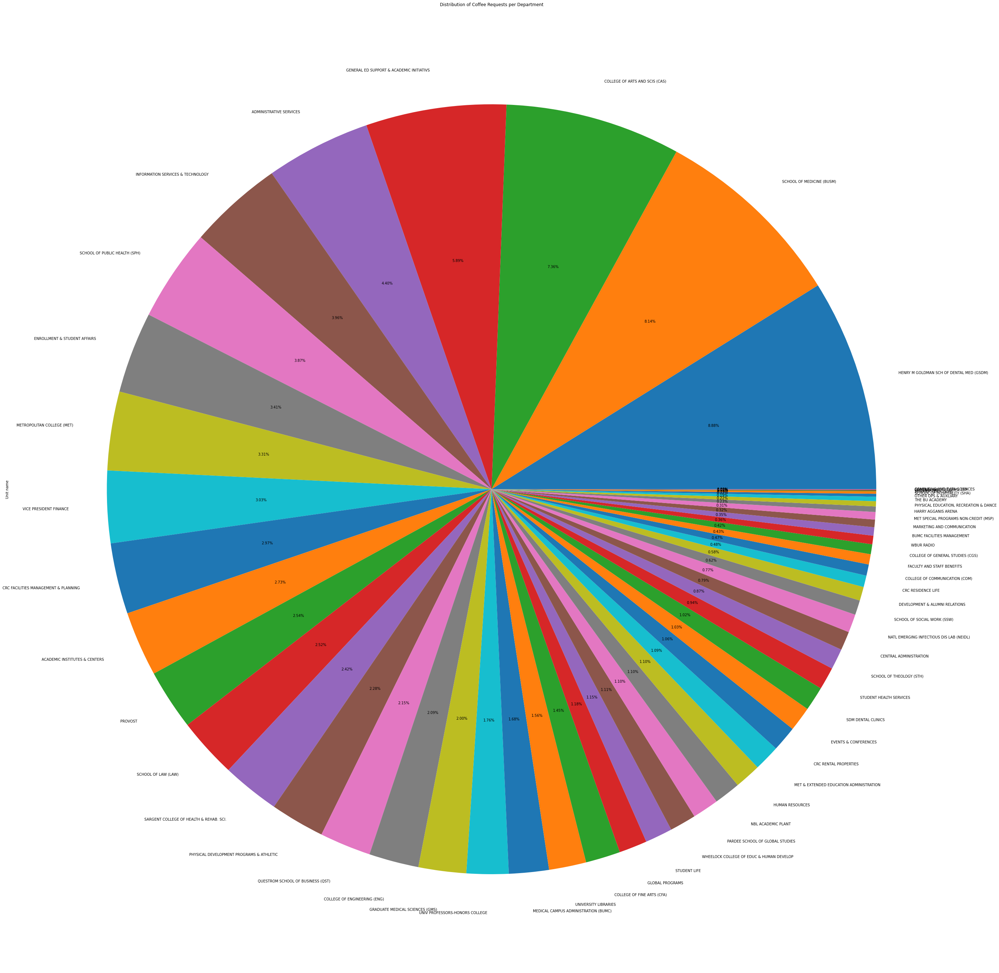

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

coffee_req['Unit name'].value_counts().plot.pie(figsize=(48,72),title="Distribution of Coffee Requests per Department",autopct='%1.2f%%')
plt.gca().set_aspect('equal')

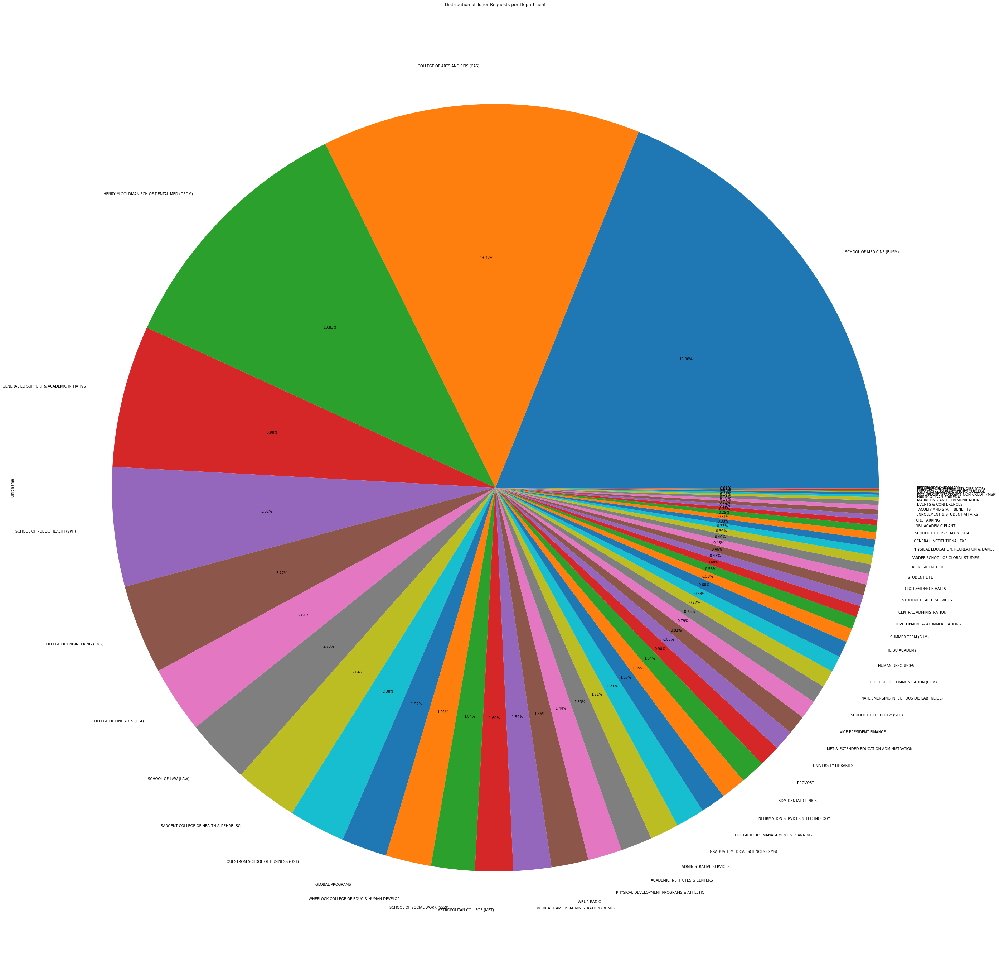

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

toner_req['Unit name'].value_counts().plot.pie(figsize=(48,72),title="Distribution of Toner Requests per Department",autopct='%1.2f%%')
plt.gca().set_aspect('equal')

In [ ]:
coffee_req, toner_req = df[df.Category=='Coffee'], df[df.Category=='Toner']
coffee_req[:10], toner_req[:10]

(    ARAVO Vendor ID  ...                                        Description
 0        10572031.0  ...  C-66920349|5853096957|Tea K-Cups Sampler, Asso...
 1        10572031.0  ...  Original Liquid Coffee Creamer, 0.38 oz. Singl...
 2        10572031.0  ...           Newman's Special Blend K-Cup Pods, 24/BX
 3        10572031.0  ...  Half AND Half Liquid Coffee Creamer, 0.3 oz. S...
 12       10572031.0  ...  French Vanilla Liquid Coffee Creamer, 0.38 oz....
 13       10572031.0  ...  Hazelnut Liquid Coffee Creamer, 0.38 oz. Singl...
 18       10572031.0  ...                Donut Shop Coffee K-Cup Pods, 24/BX
 19       10572031.0  ...      English Breakfast Black Tea K-Cup Pods, 24/BX
 20       10572031.0  ...     Dark Magic Extra Bold Coffee K-Cup Pods, 24/BX
 21       10572031.0  ...  C-24871677|5751038288|French Roast Coffee K-Cu...
 
 [10 rows x 18 columns],
     ARAVO Vendor ID  ...                                        Description
 4        10572031.0  ...  C-63961931|5840488845|

In [ ]:

coffee_req['upper part'].value_counts()[:10]

['GMT6520',
 'GMT4061',
 'GMT6663',
 'NES35110BX',
 'GMT6732',
 'ITD102042',
 'GMT6792',
 'GMT6694',
 'GMT9572',
 'GMT0845']

In [ ]:
toner_req['upper part'].value_counts()[:10]



HEWCE505A      317
HEWCN045AN     285
HEWCR314FN     284
DXE2342PATH    282
HEWCE410A      256
HEWCF280A      207
HEWCF410A      202
HEWCE278A      187
HEWCE411A      178
HEWCE412A      178
Name: upper part, dtype: int64

"GMT6520"
The mean is ：0.686462
The standard div is ：1.322605


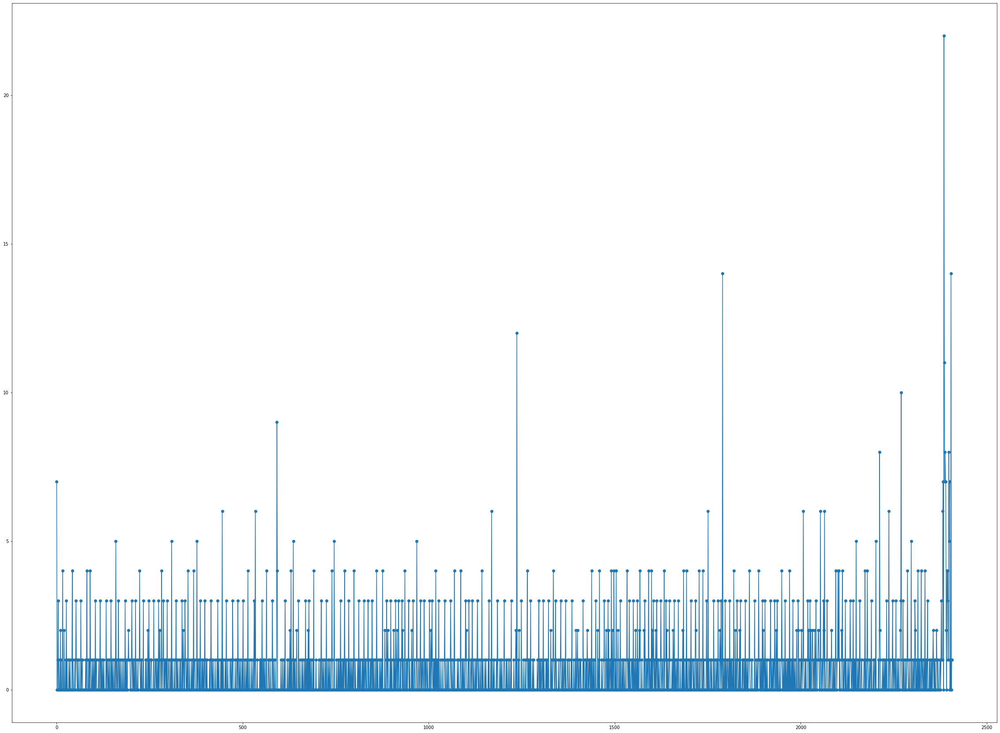

"GMT4061"
The mean is ：0.720665
The standard div is ：1.468255


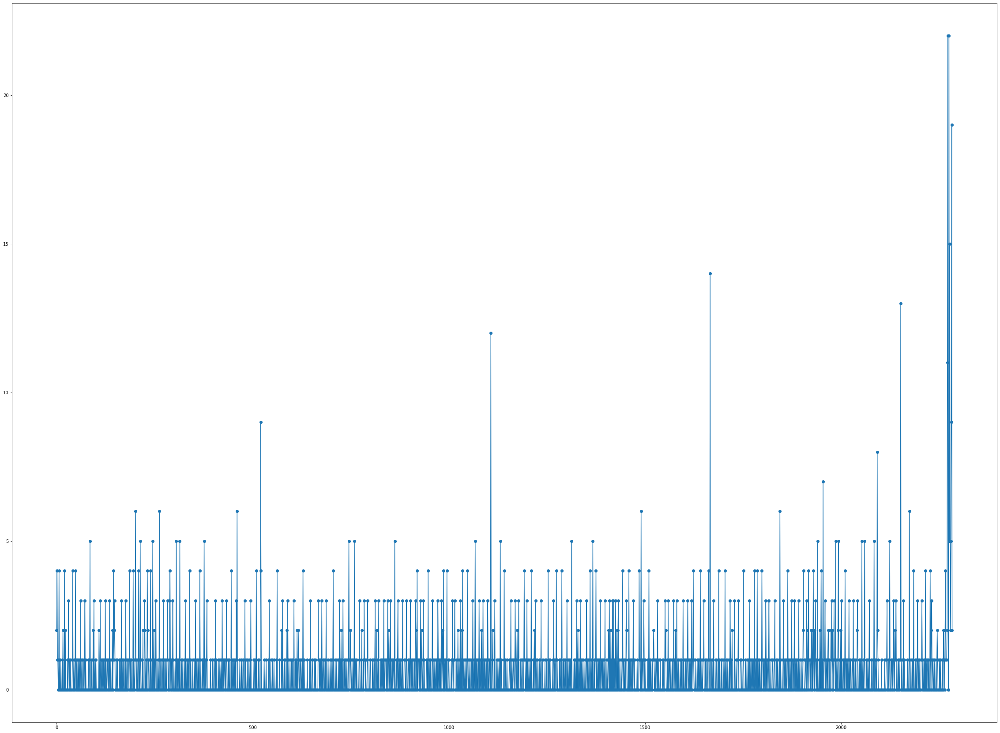

"GMT6663"
The mean is ：1.060606
The standard div is ：1.759254


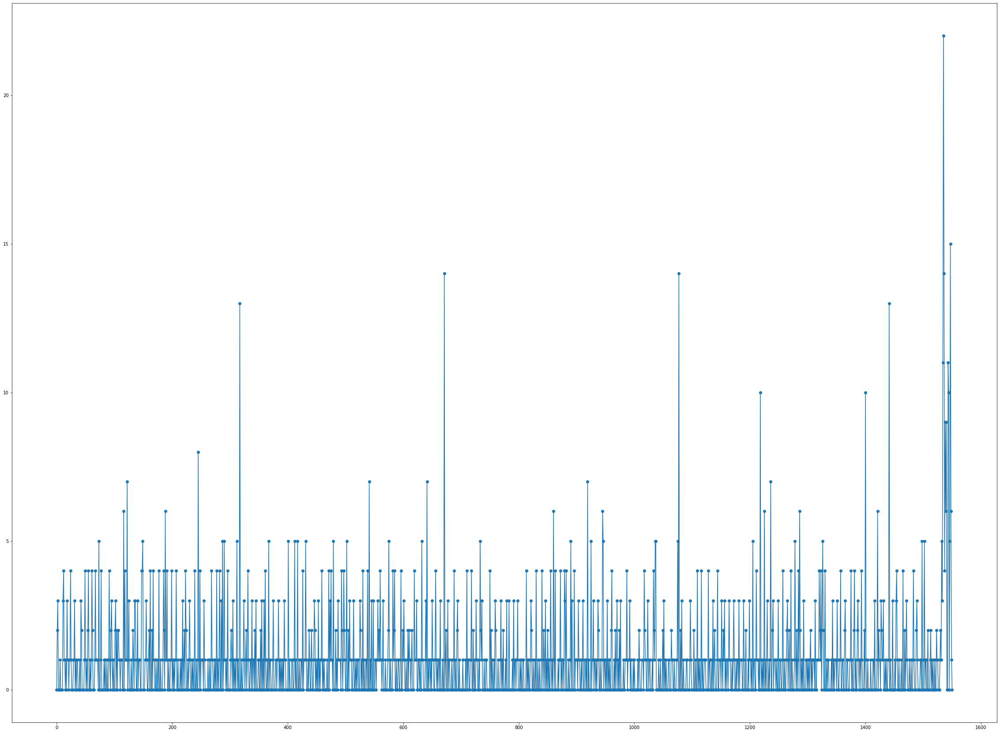

"NES35110BX"
The mean is ：1.261597
The standard div is ：2.052914


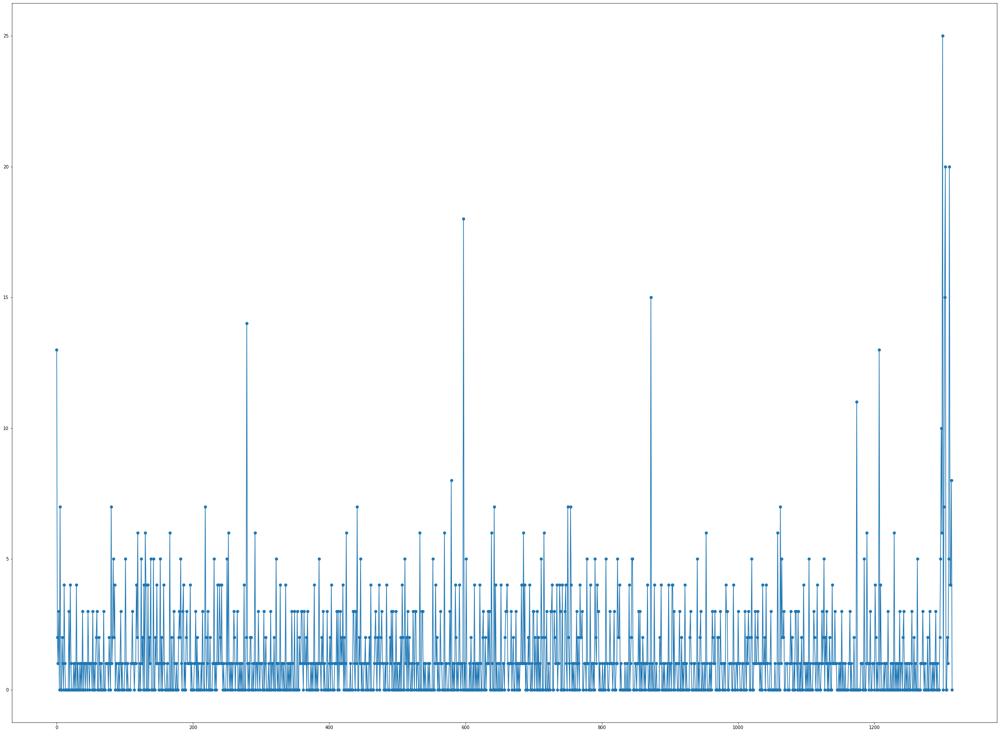

"GMT6732"
The mean is ：1.378649
The standard div is ：2.156530


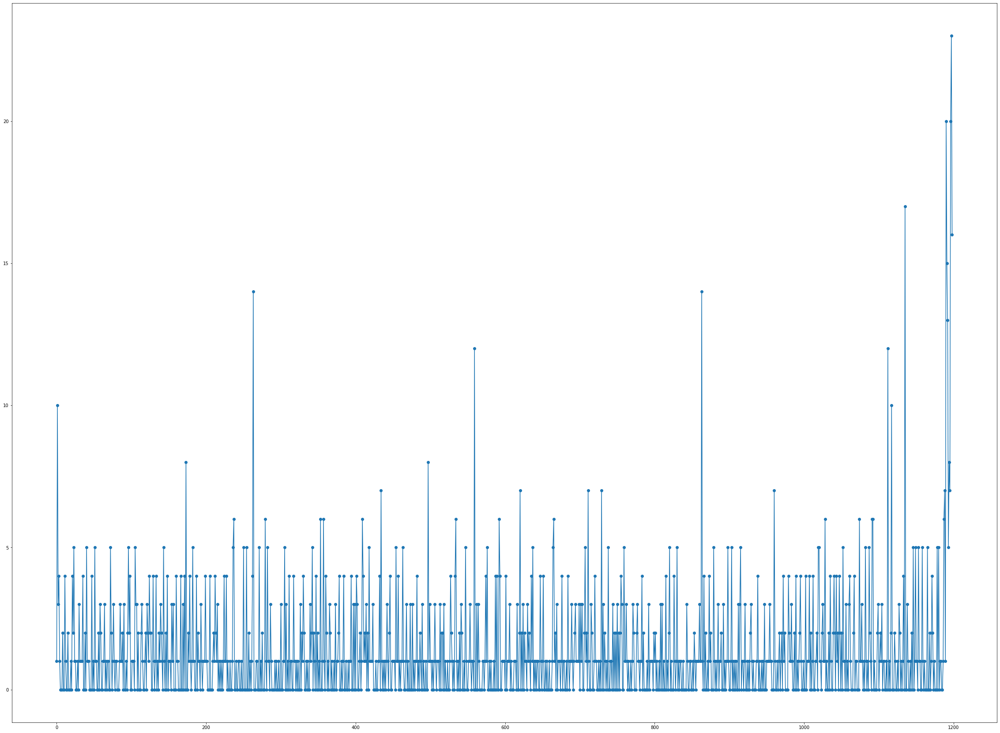

"ITD102042"
The mean is ：1.402053
The standard div is ：3.829675


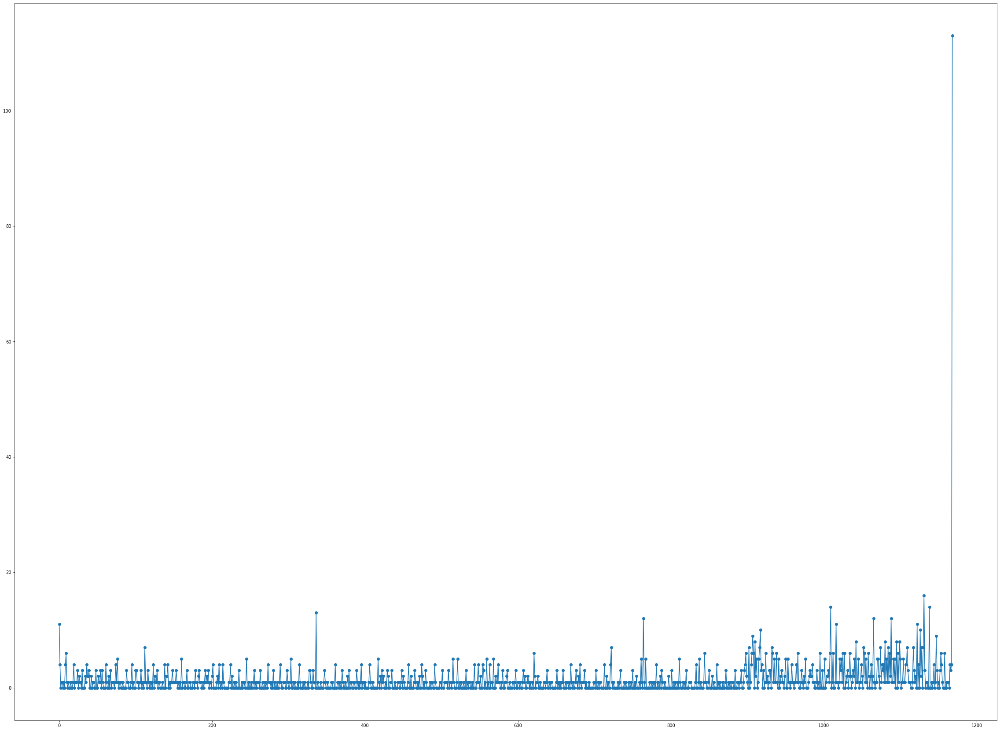

"GMT6792"
The mean is ：1.527002
The standard div is ：2.153711


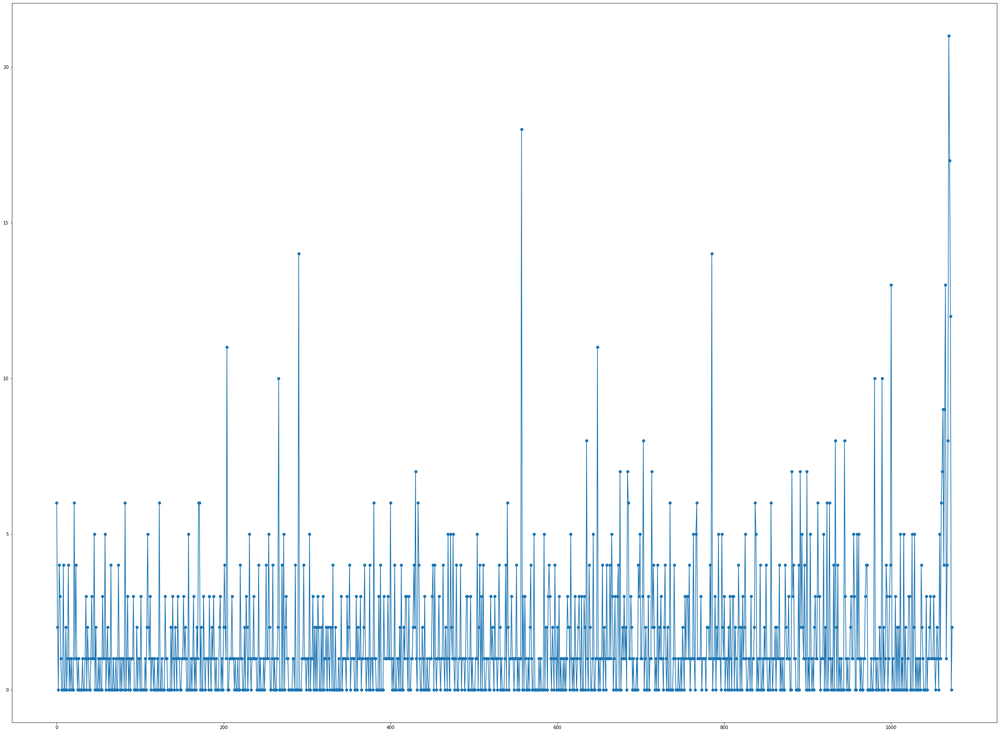

"GMT6694"
The mean is ：1.611765
The standard div is ：2.578238


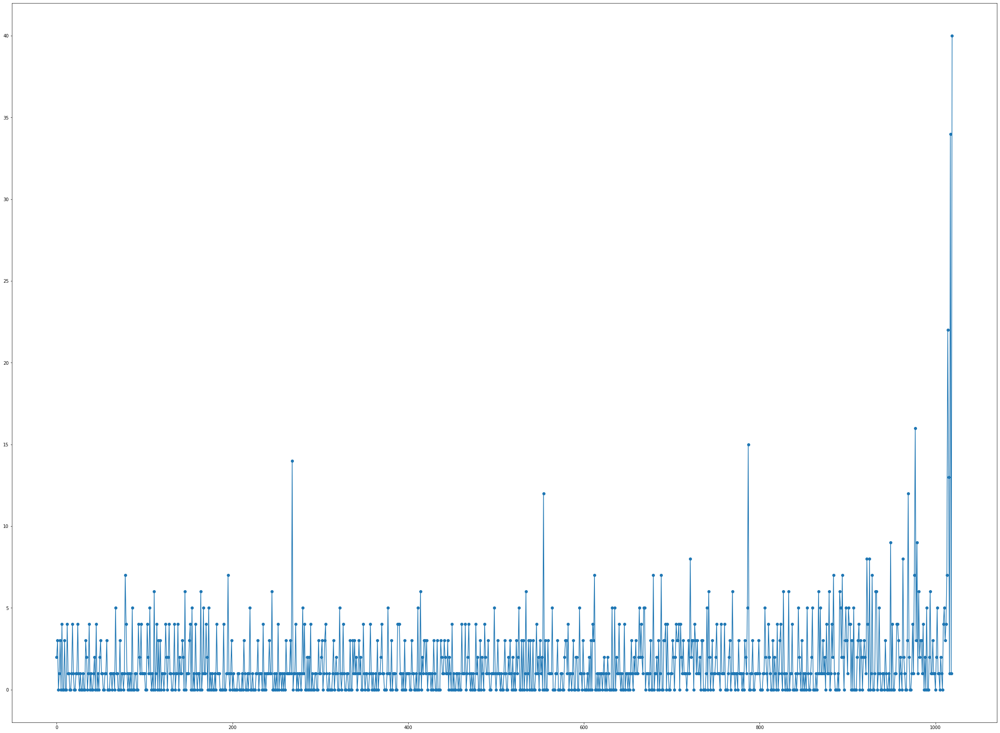

"GMT9572"
The mean is ：1.711759
The standard div is ：2.624062


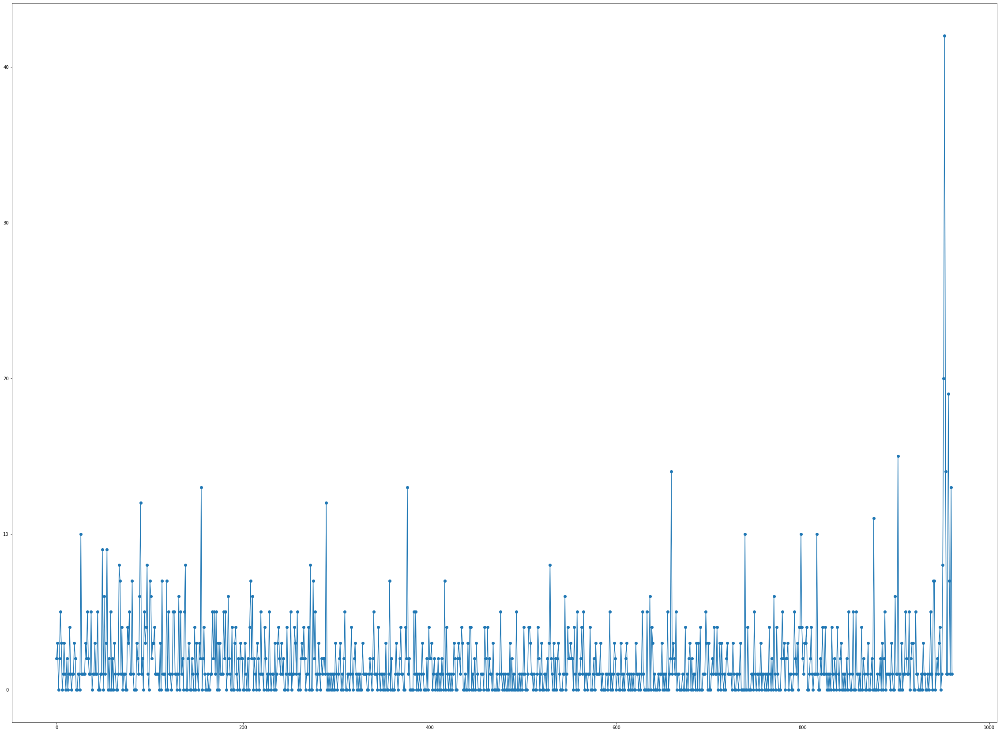

"GMT0845"
The mean is ：1.366556
The standard div is ：2.702214


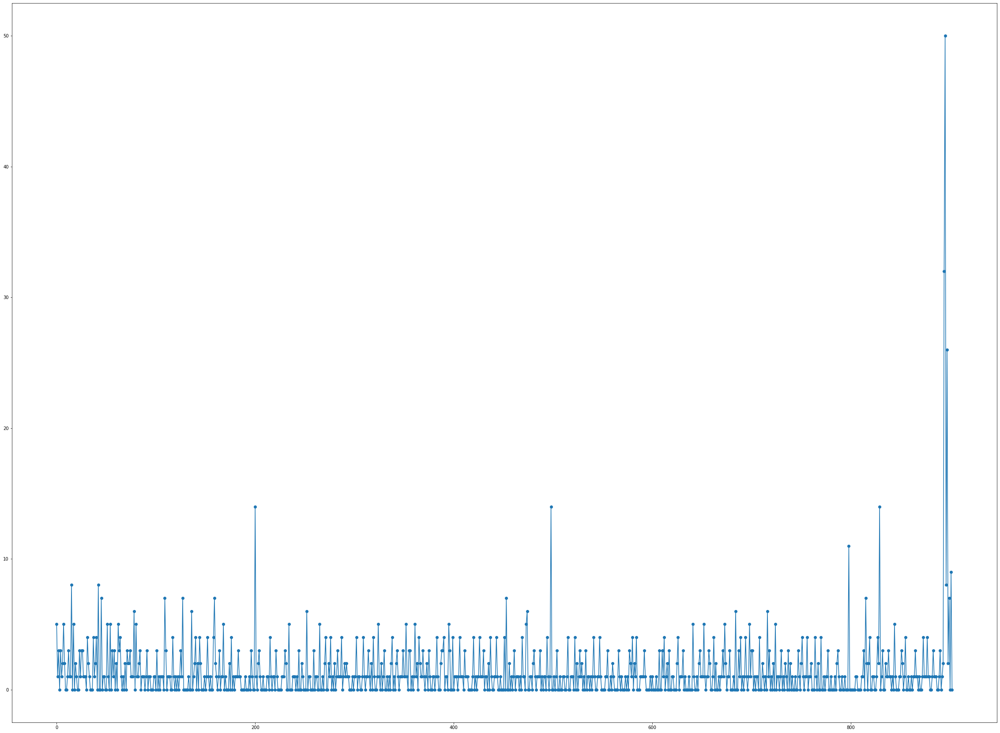

"HEWCE505A"
The mean is ：5.145570
The standard div is ：7.125748


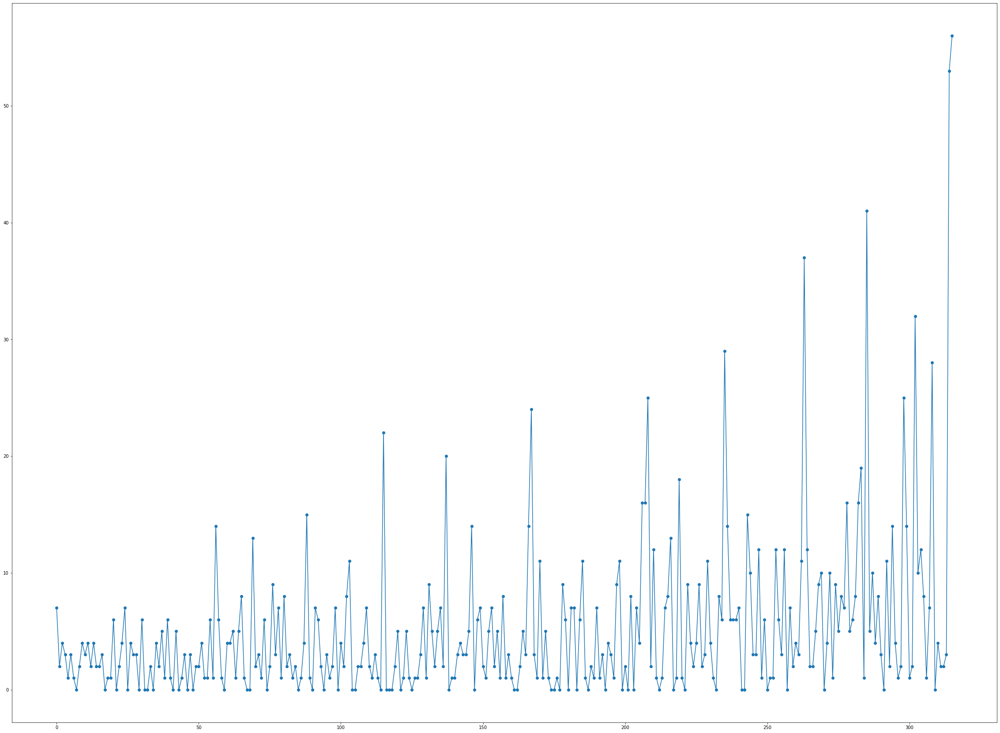

"HEWCN045AN"
The mean is ：5.672535
The standard div is ：6.151991


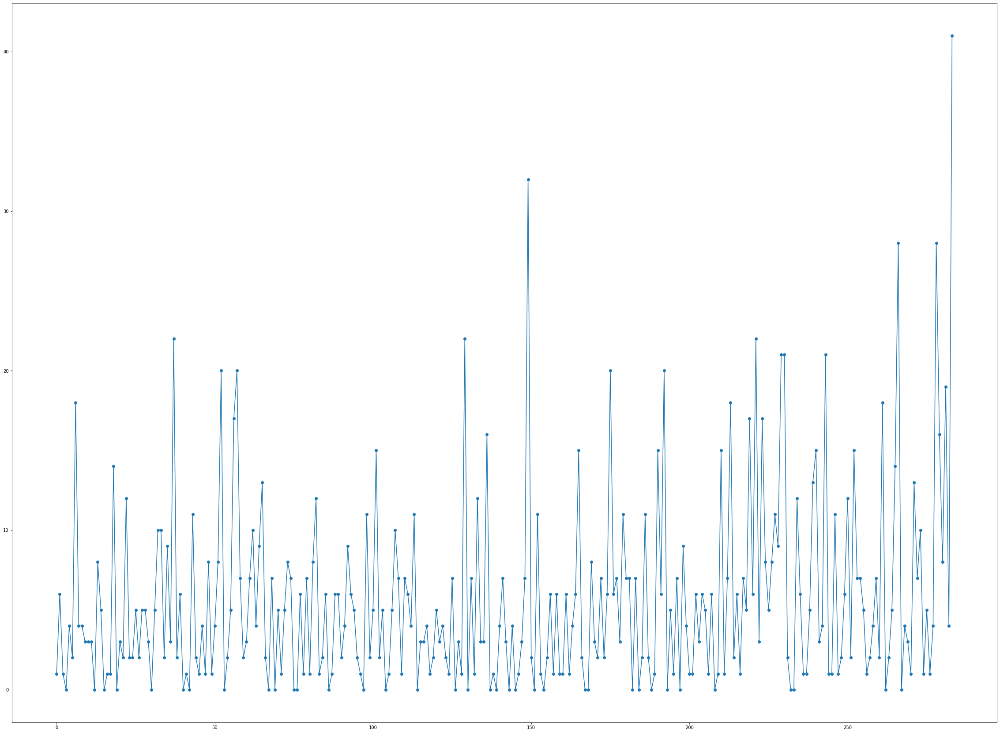

"HEWCR314FN"
The mean is ：5.692580
The standard div is ：6.263996


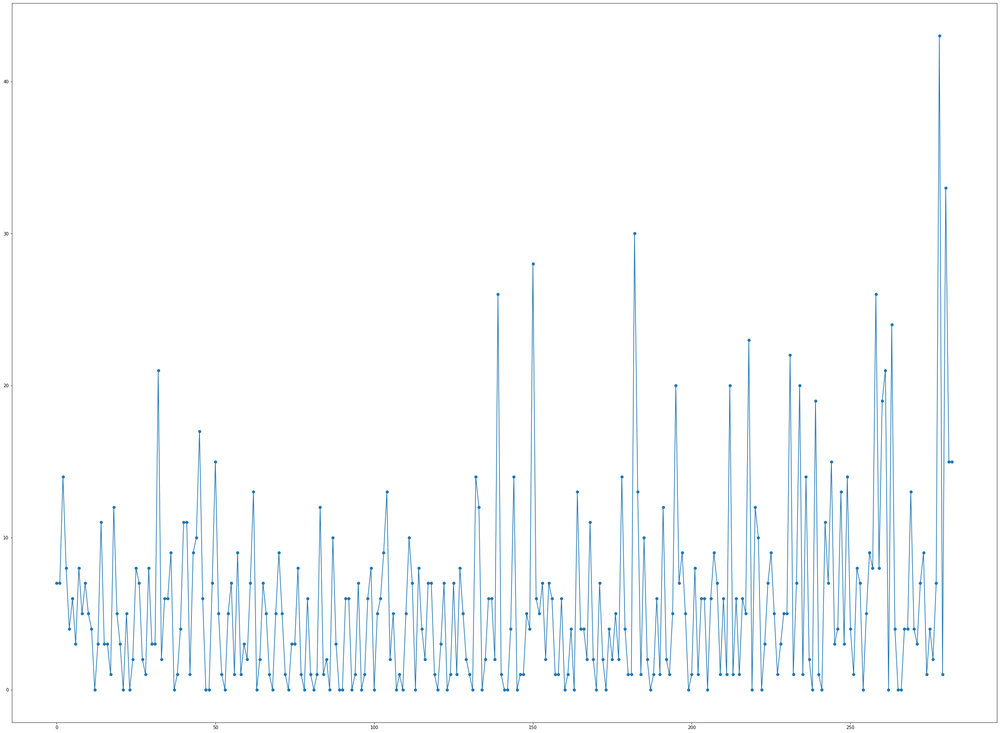

"DXE2342PATH"
The mean is ：5.811388
The standard div is ：6.382528


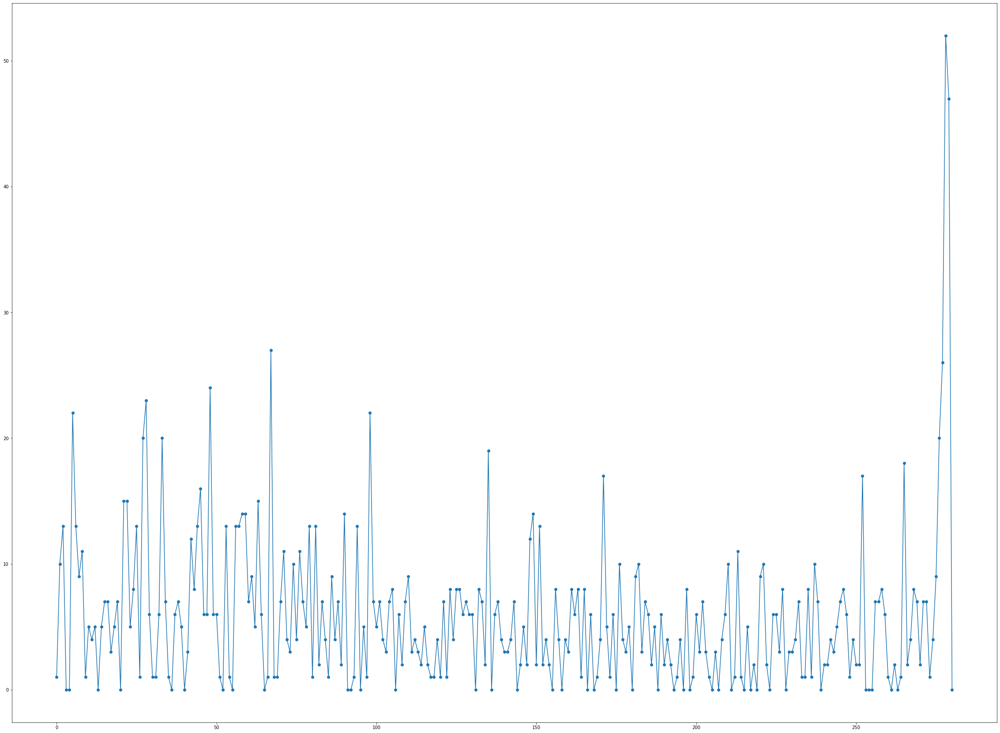

"HEWCE410A"
The mean is ：6.443137
The standard div is ：9.135349


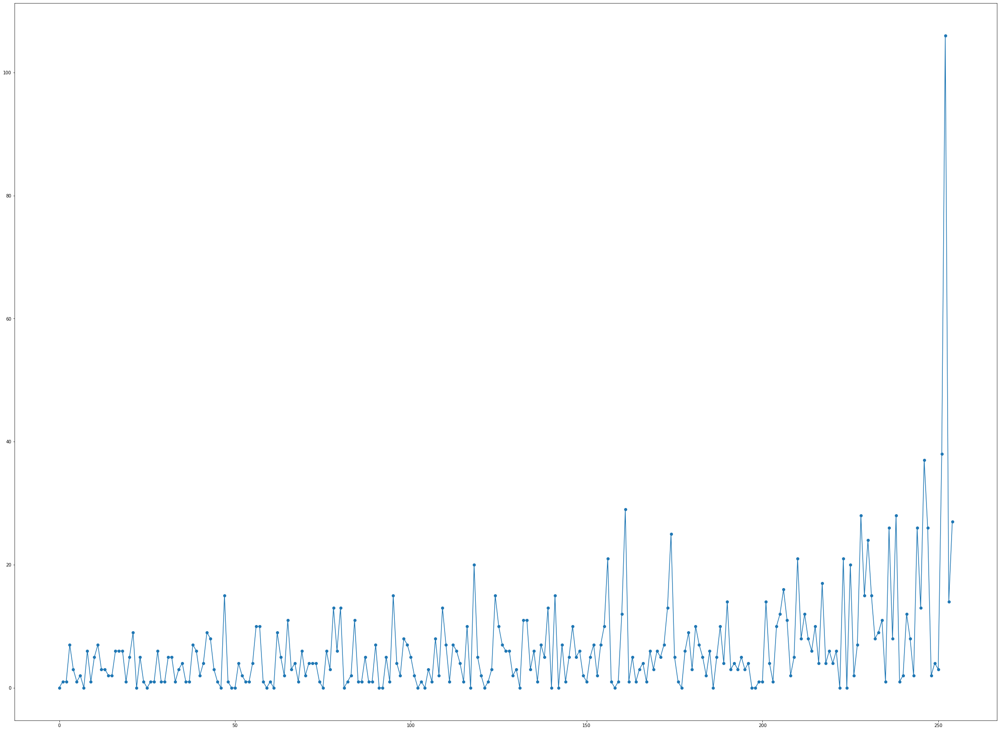

"HEWCF280A"
The mean is ：7.519417
The standard div is ：8.134614


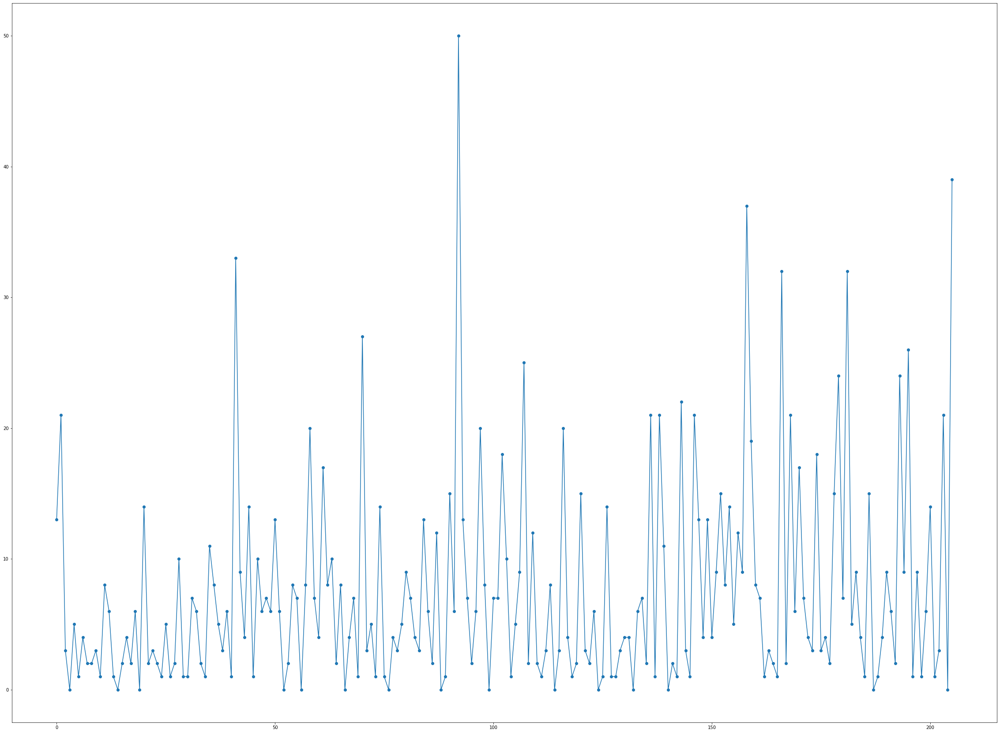

"HEWCF410A"
The mean is ：8.129353
The standard div is ：9.431248


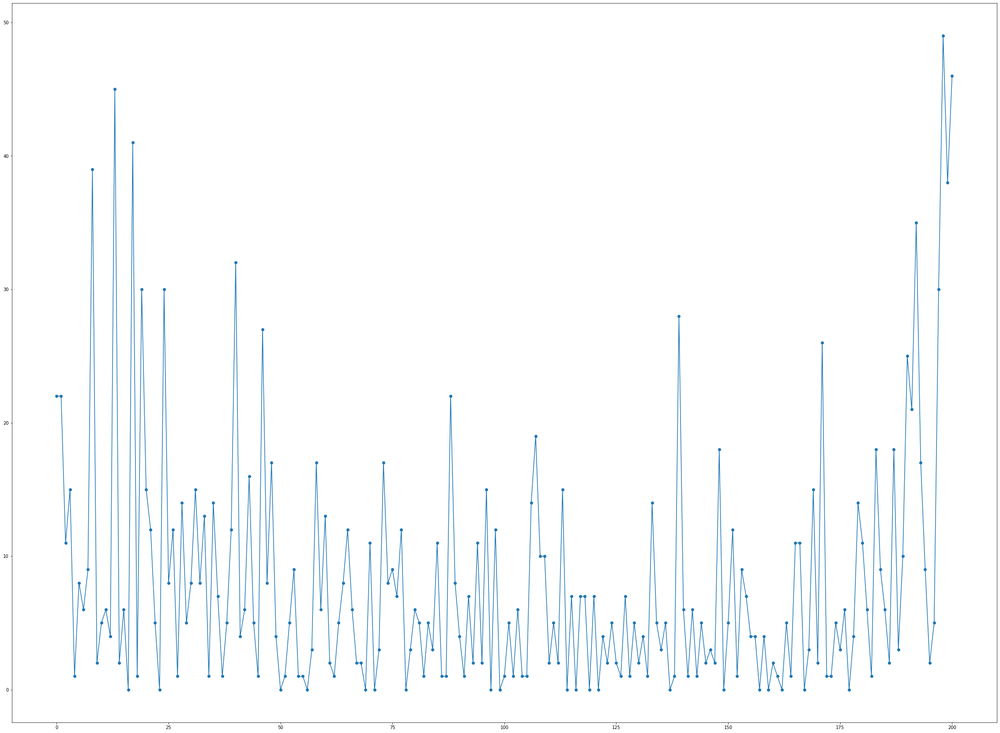

"HEWCE278A"
The mean is ：8.505376
The standard div is ：10.112404


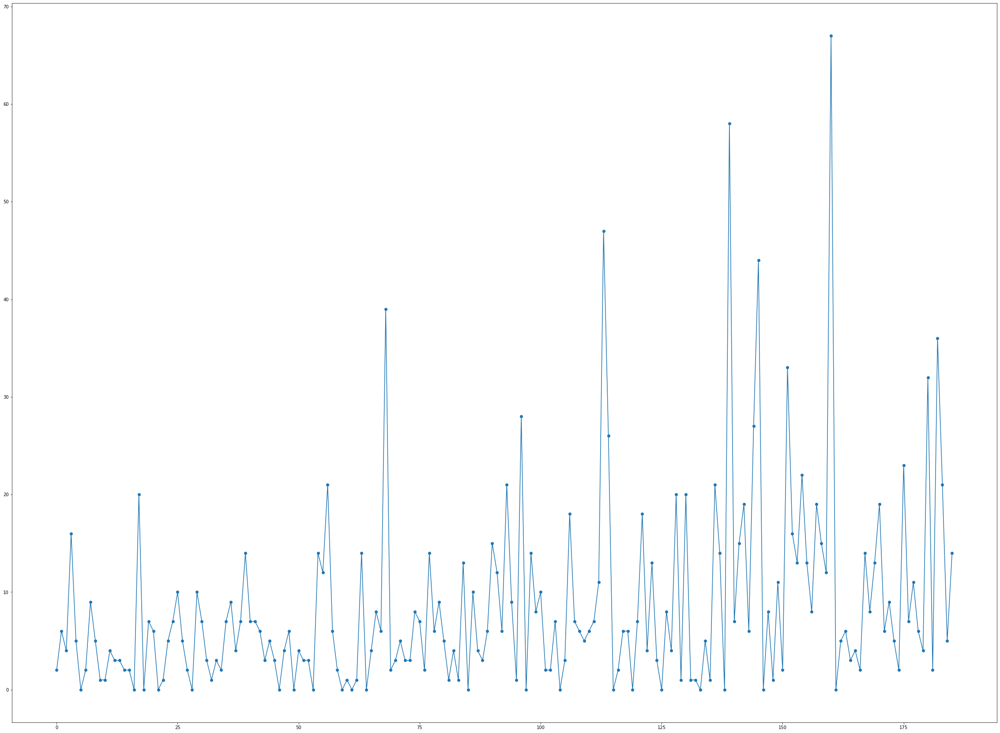

"HEWCE411A"
The mean is ：9.282486
The standard div is ：13.213988


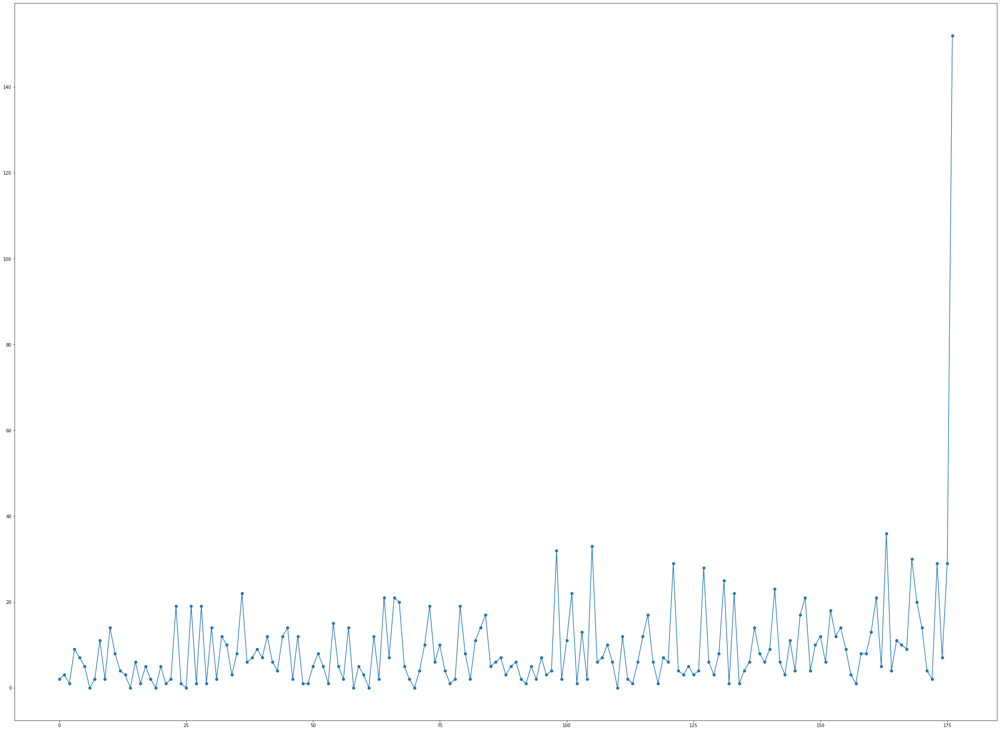

"HEWCE412A"
The mean is ：9.282486
The standard div is ：13.594589


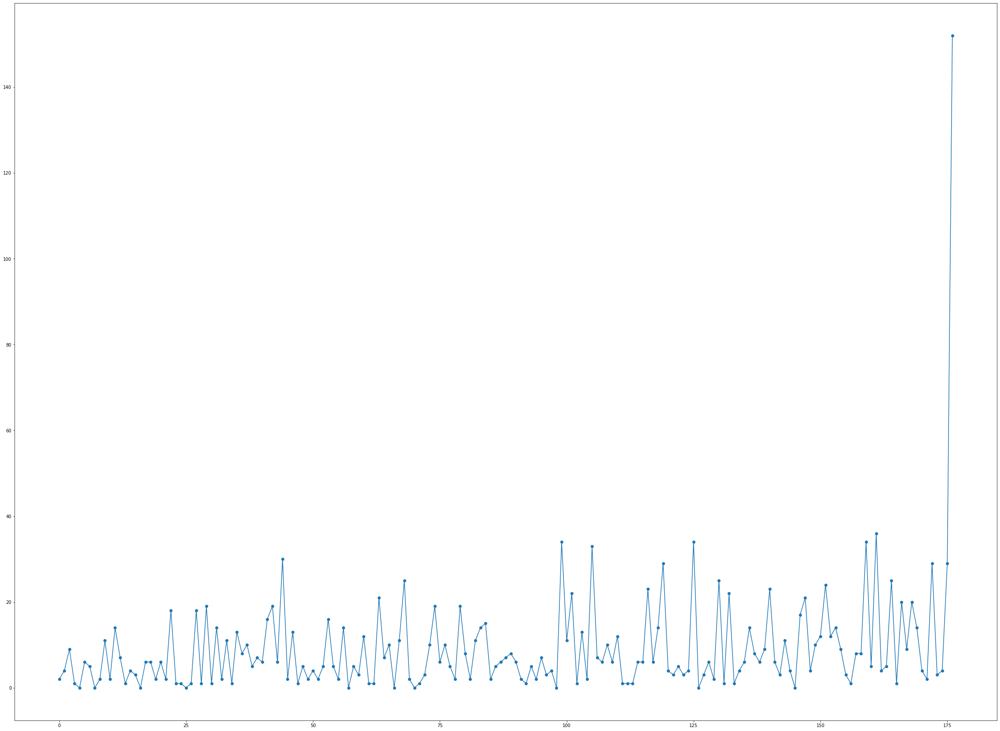

In [ ]:

top10coffee=coffee_req['upper part'].value_counts()[:10]._stat_axis.values.tolist()
top10toner=toner_req['upper part'].value_counts()[:10]._stat_axis.values.tolist()
import matplotlib.pyplot as plt


def find_thecoffee_gap(name):
  for h in name:
    print('"{0}"'.format(h))
    a1=coffee_req[coffee_req['Product P/N (Vendor)'] == h]['PO Creation Date'].tolist()
    # print(a1)
    a1 = sorted(a1)

    
    a11 = []
    for i in range(len(a1)-1):
      a11.append((a1[i+1]-a1[i]).days)
    # print(a11)
    
    arr_mean=(np.mean(a11))
    arr_std=(np.std(a11))

    print("The mean is ：%f" % arr_mean)

    print("The standard div is ：%f" % arr_std)
    plt.plot(range(len(a11)), a11, '-o')
    plt.rcParams["figure.figsize"] = (40,30)
    plt.show()


def find_thetoner_gap(name):
  for h in name:
    print('"{0}"'.format(h))
    a1=toner_req[toner_req['Product P/N (Vendor)'] == h]['PO Creation Date'].tolist()
    # print(a1)
    a1 = sorted(a1)
    a11 = []
    for i in range(len(a1)-1):
      a11.append((a1[i+1]-a1[i]).days)
    arr_mean=(np.mean(a11))
    arr_std=(np.std(a11))

    print("The mean is ：%f" % arr_mean)

    print("The standard div is ：%f" % arr_std)
    plt.plot(range(len(a11)), a11, '-o')
    plt.rcParams["figure.figsize"] = (40,30)
    plt.show()



find_thecoffee_gap(top10coffee)
find_thetoner_gap(top10toner)

"HENRY M GOLDMAN SCH OF DENTAL MED (GSDM)"
The mean is ：0.406450
The standard div is ：1.151065


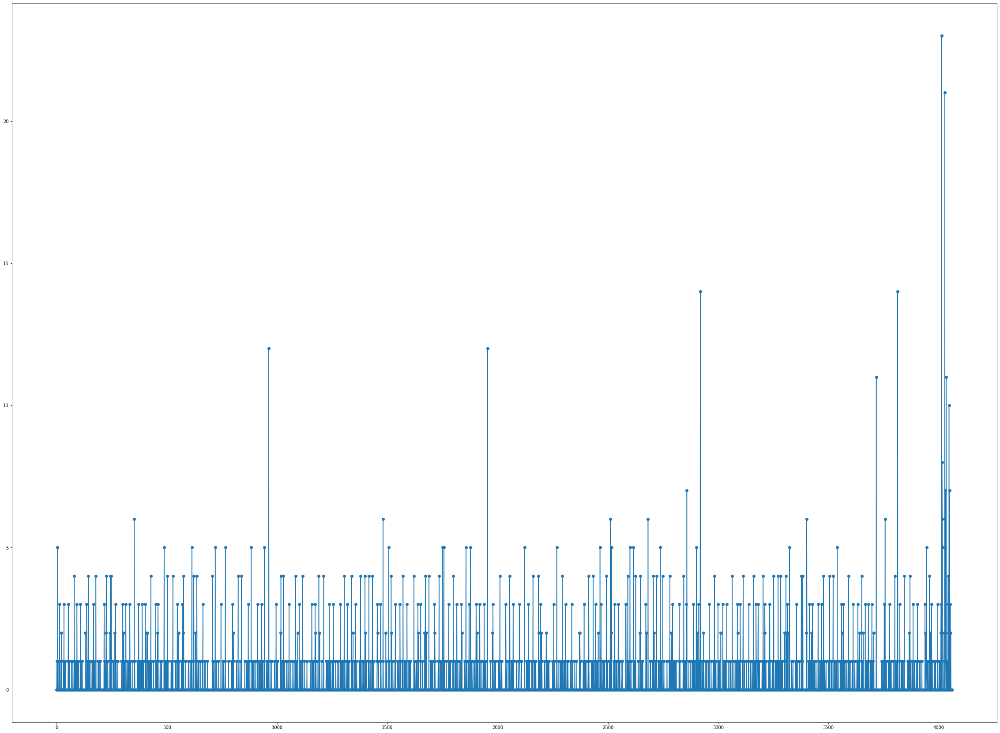

"SCHOOL OF MEDICINE (BUSM)"
The mean is ：0.442085
The standard div is ：2.212311


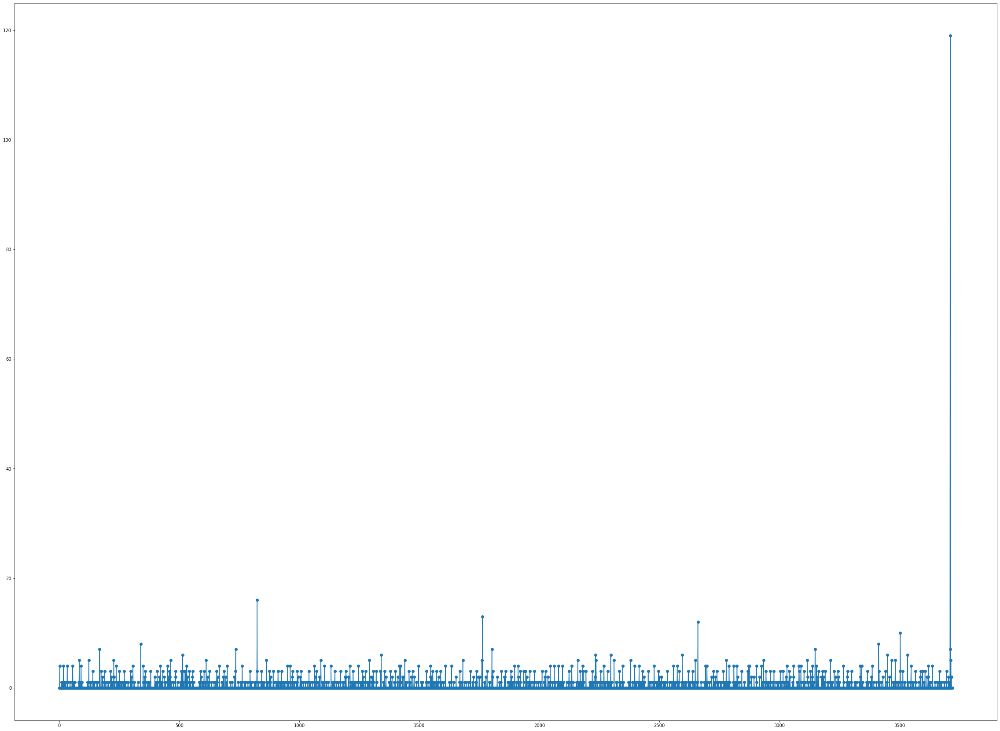

"COLLEGE OF ARTS AND SCIS (CAS)"
The mean is ：0.488559
The standard div is ：1.961957


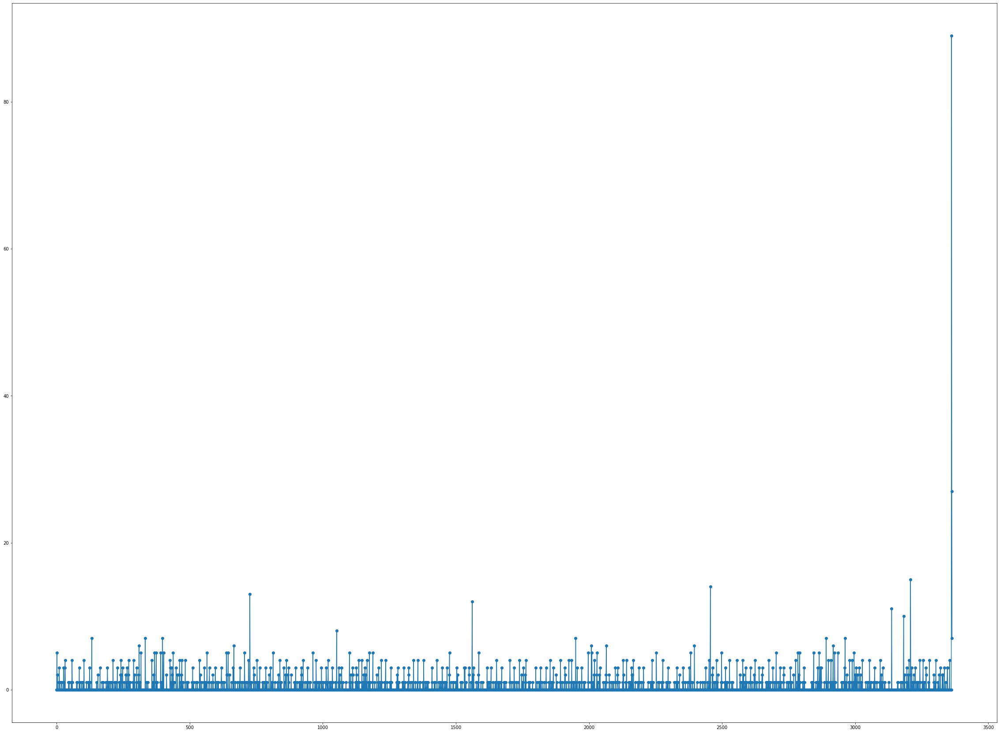

"GENERAL ED SUPPORT & ACADEMIC INITIATIVS"
The mean is ：0.611132
The standard div is ：1.555702


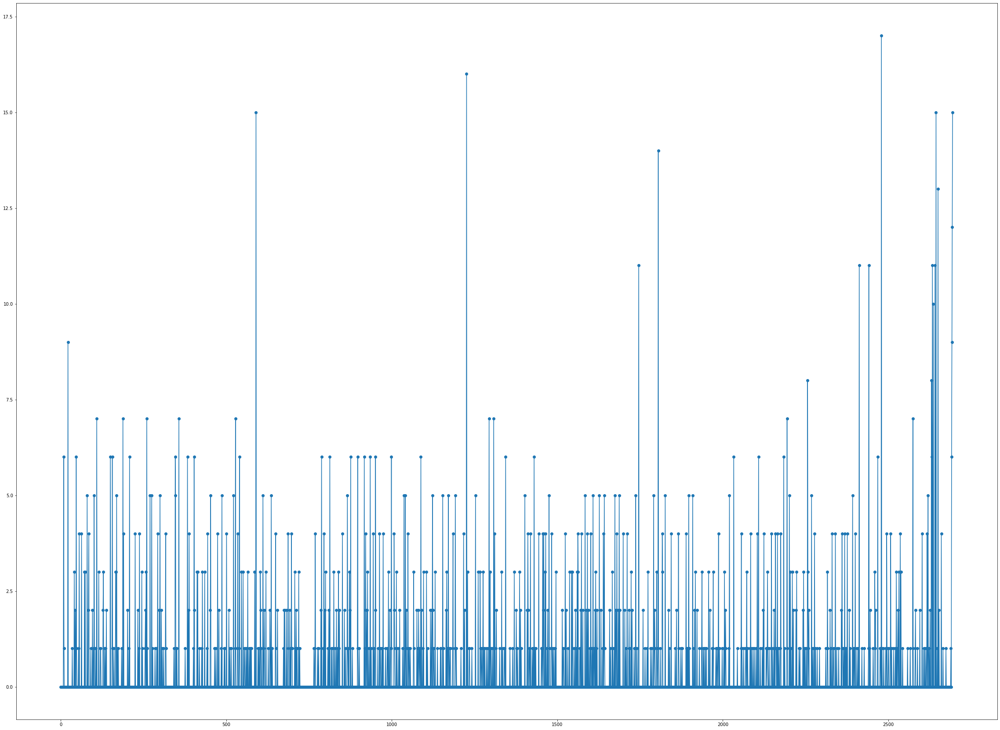

"ADMINISTRATIVE SERVICES"
The mean is ：0.824143
The standard div is ：2.911490


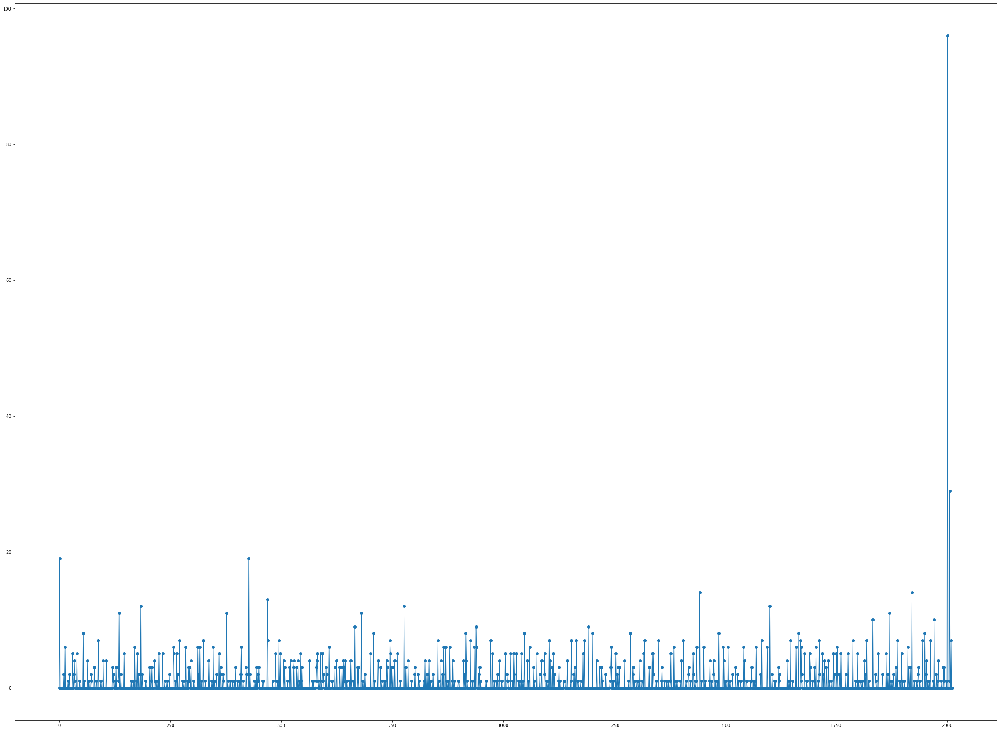

"INFORMATION SERVICES & TECHNOLOGY"
The mean is ：0.840972
The standard div is ：2.373492


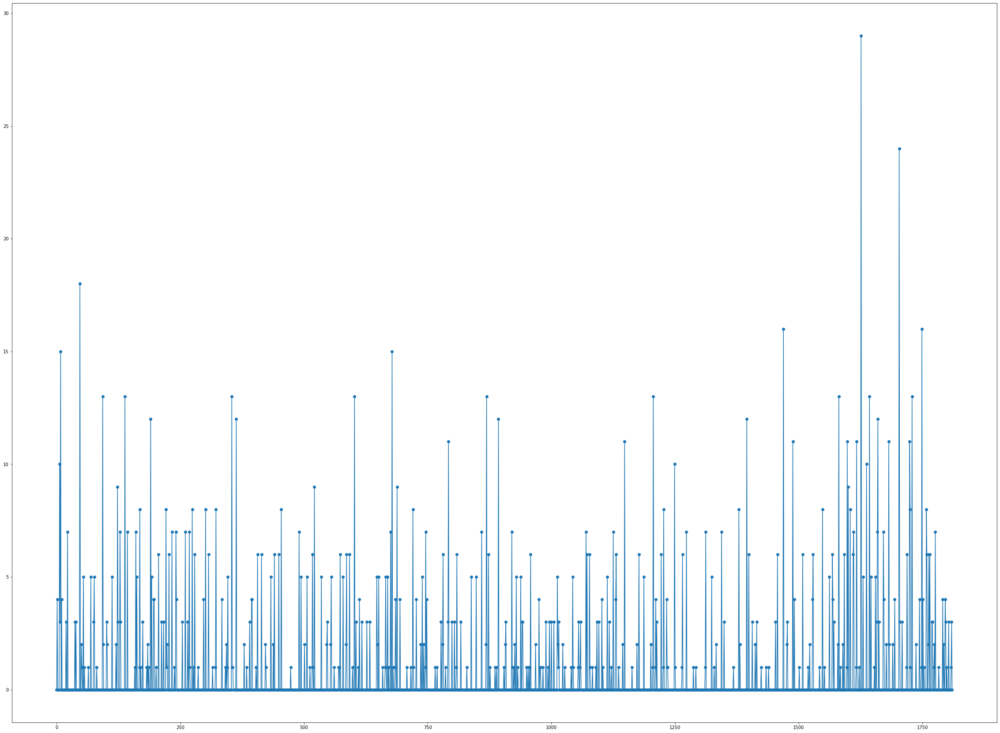

"SCHOOL OF PUBLIC HEALTH (SPH)"
The mean is ：0.856900
The standard div is ：1.983643


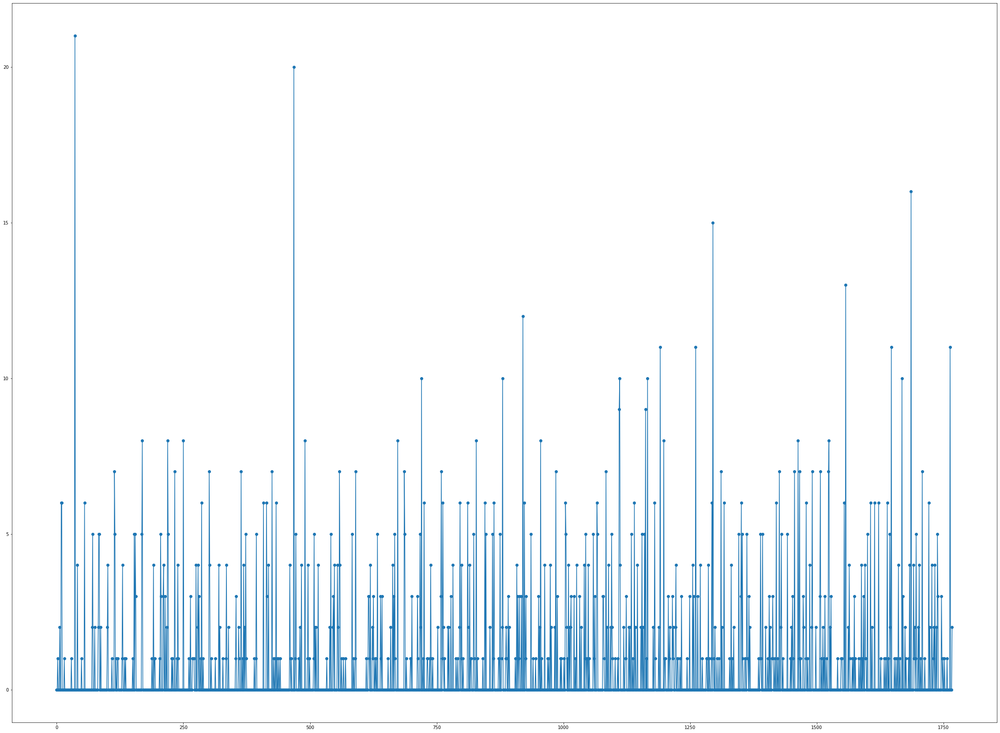

"ENROLLMENT & STUDENT AFFAIRS"
The mean is ：0.971098
The standard div is ：2.818384


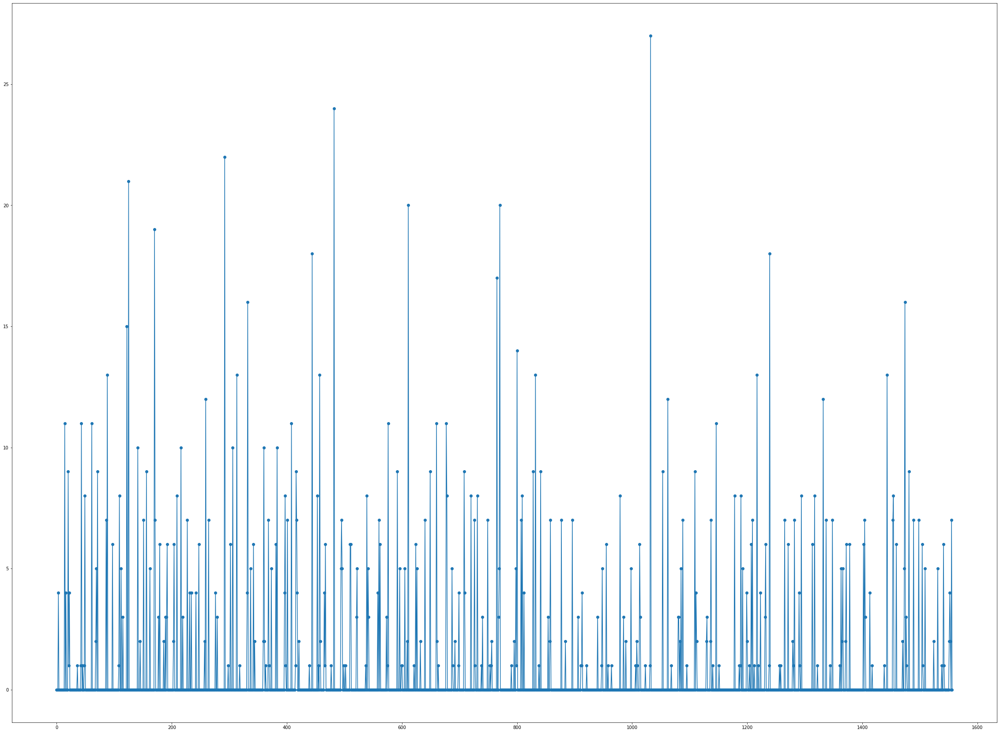

"METROPOLITAN COLLEGE (MET)"
The mean is ：1.003309
The standard div is ：2.329988


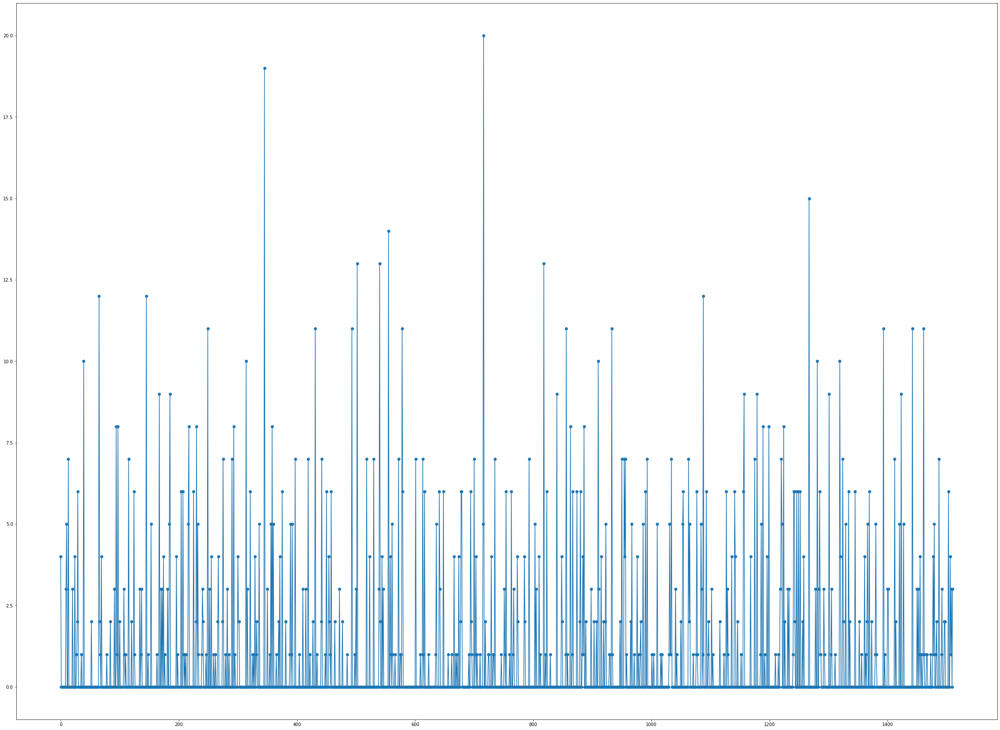

"VICE PRESIDENT FINANCE"
The mean is ：1.189306
The standard div is ：4.133292


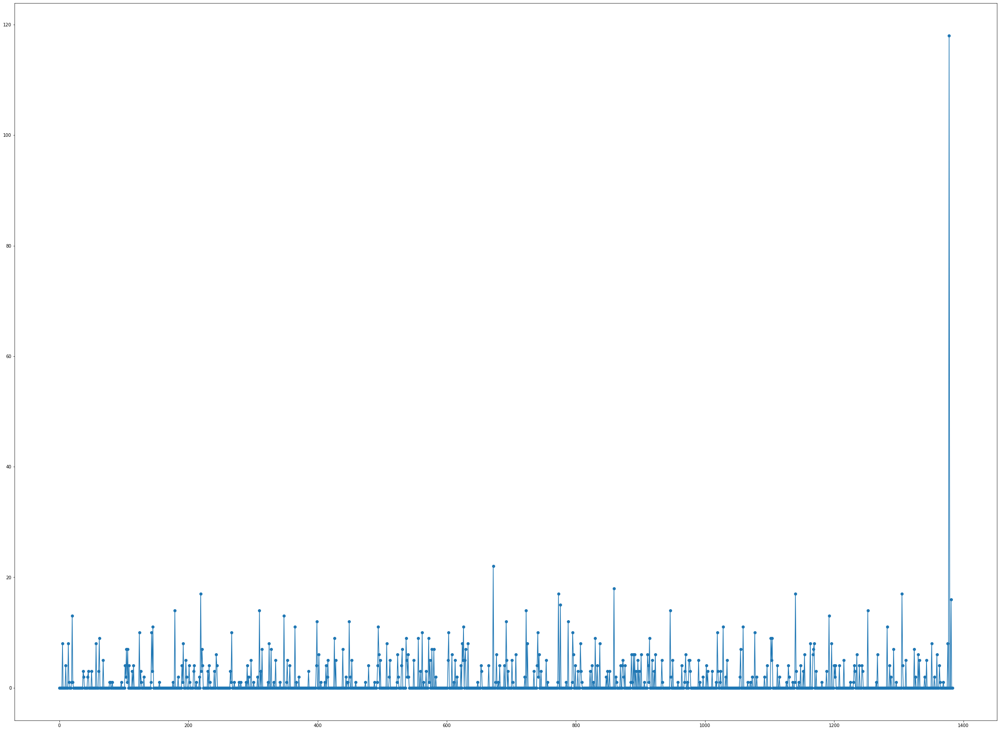

Figure of toner is below
"SCHOOL OF MEDICINE (BUSM)"
The mean is ：0.572071
The standard div is ：1.499190


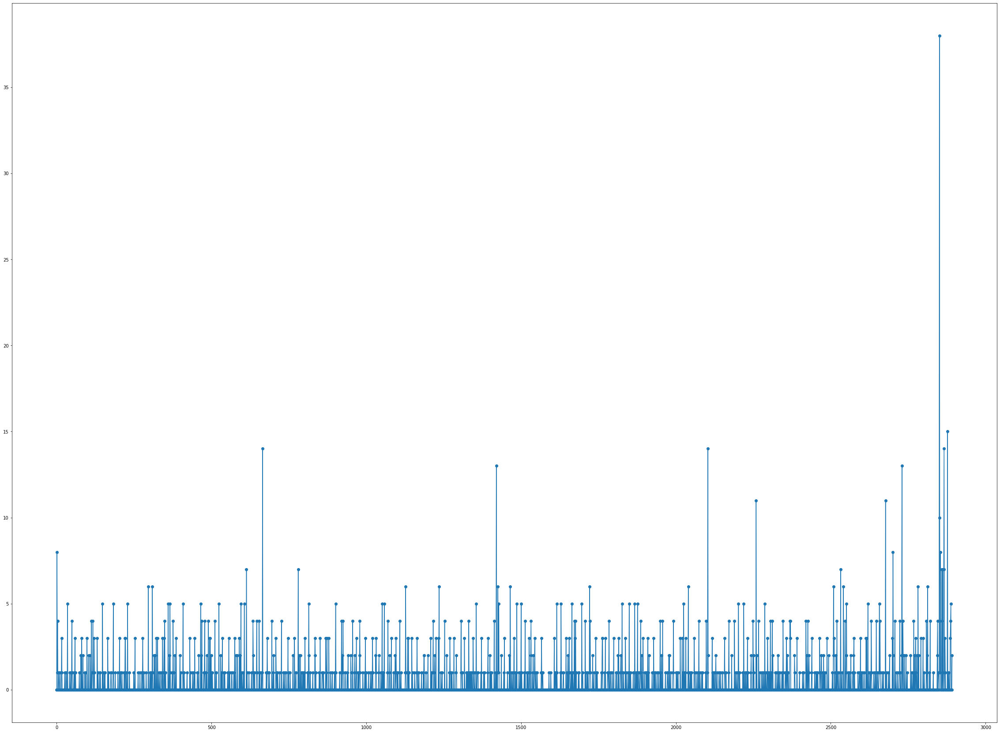

"COLLEGE OF ARTS AND SCIS (CAS)"
The mean is ：0.796981
The standard div is ：1.699467


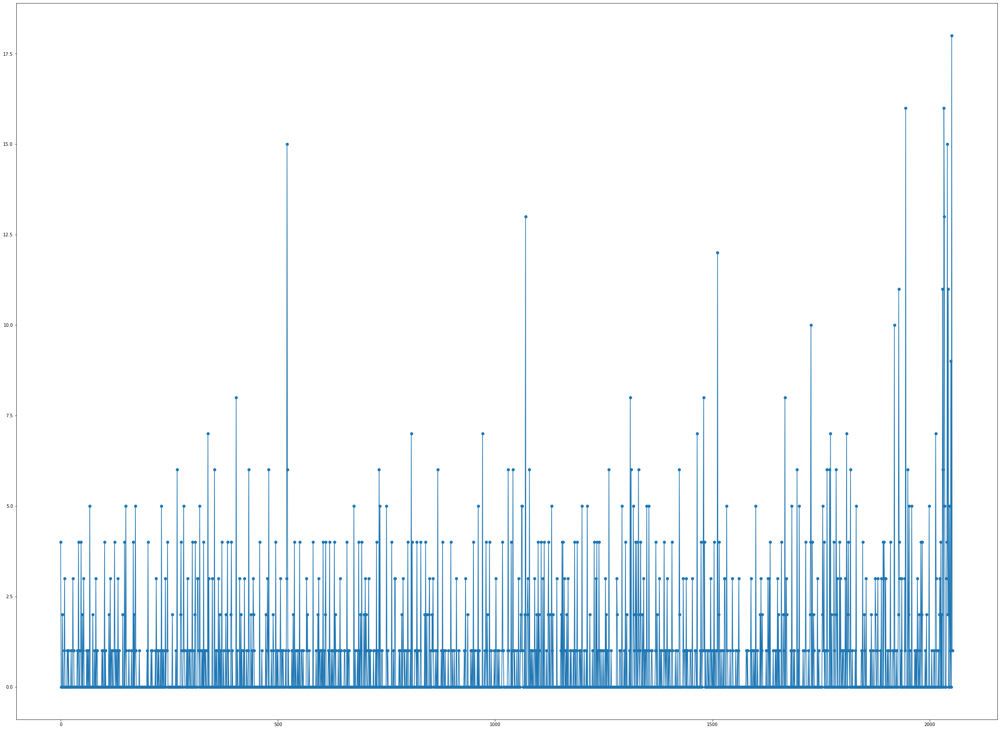

"HENRY M GOLDMAN SCH OF DENTAL MED (GSDM)"
The mean is ：0.997587
The standard div is ：2.162571


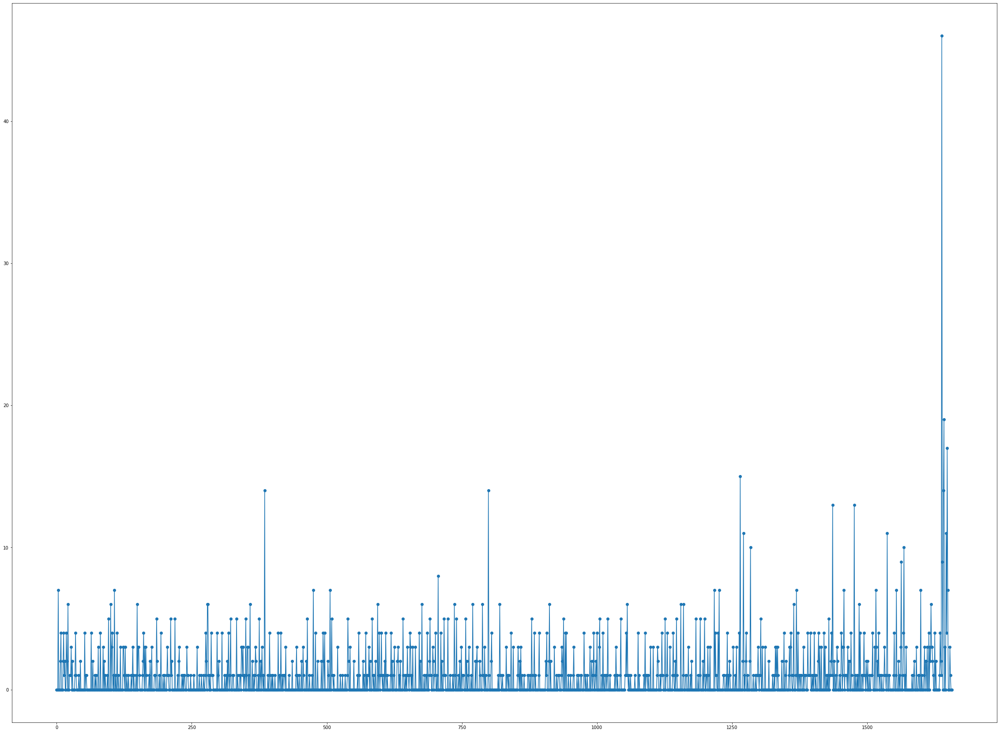

"GENERAL ED SUPPORT & ACADEMIC INITIATIVS"
The mean is ：1.807440
The standard div is ：3.505561


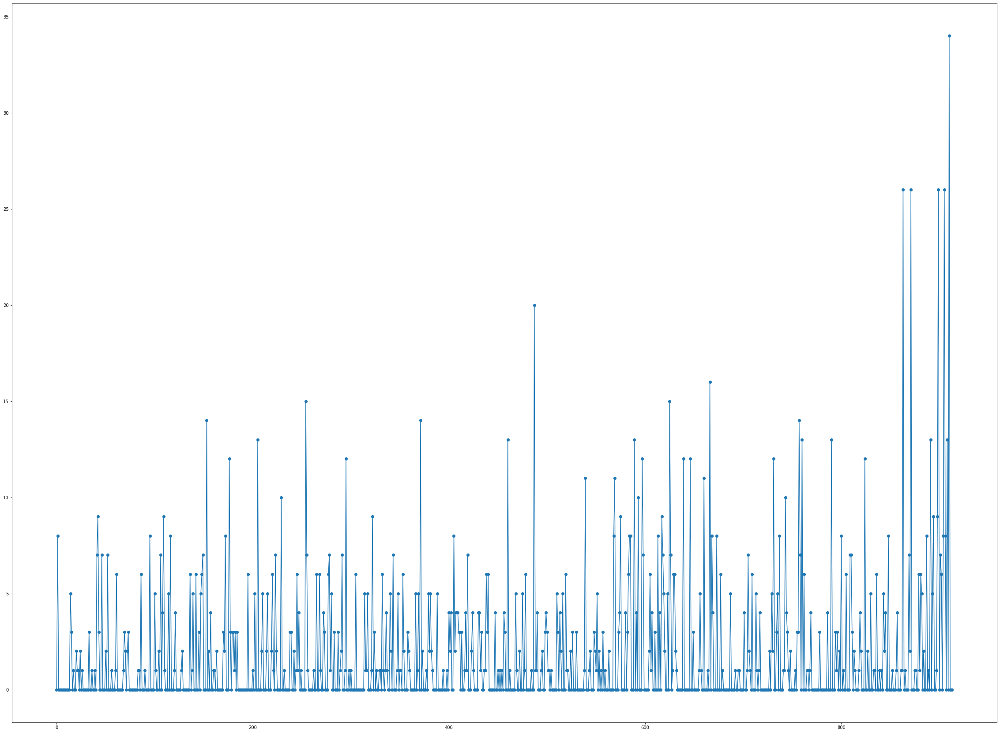

"SCHOOL OF PUBLIC HEALTH (SPH)"
The mean is ：2.061198
The standard div is ：3.883412


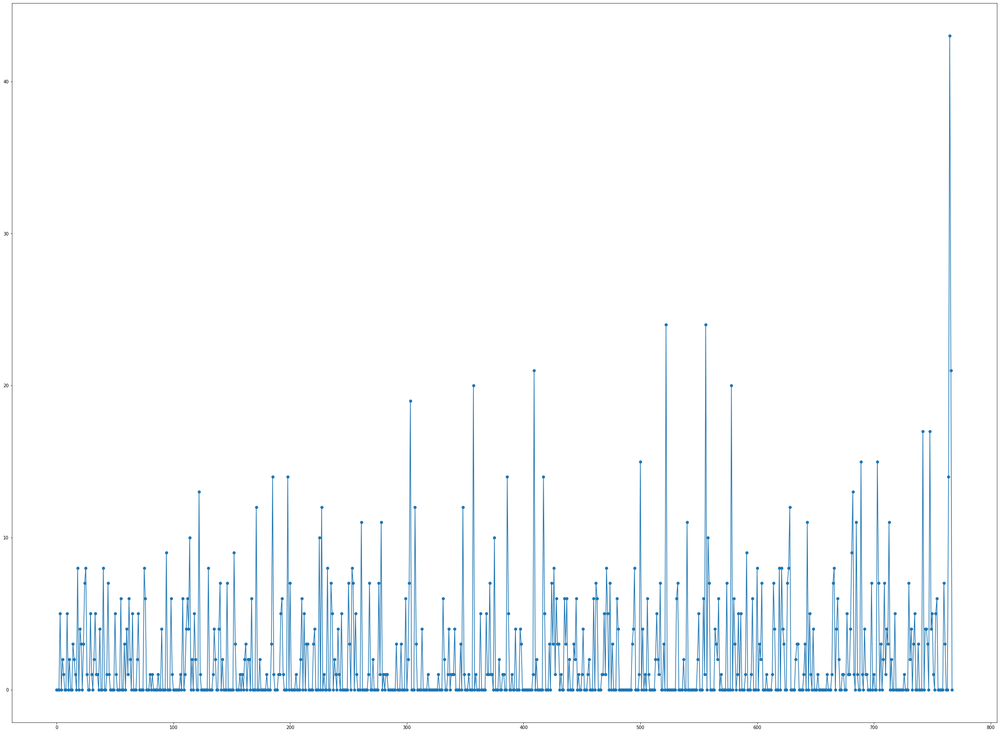

"COLLEGE OF ENGINEERING (ENG)"
The mean is ：2.819444
The standard div is ：6.663961


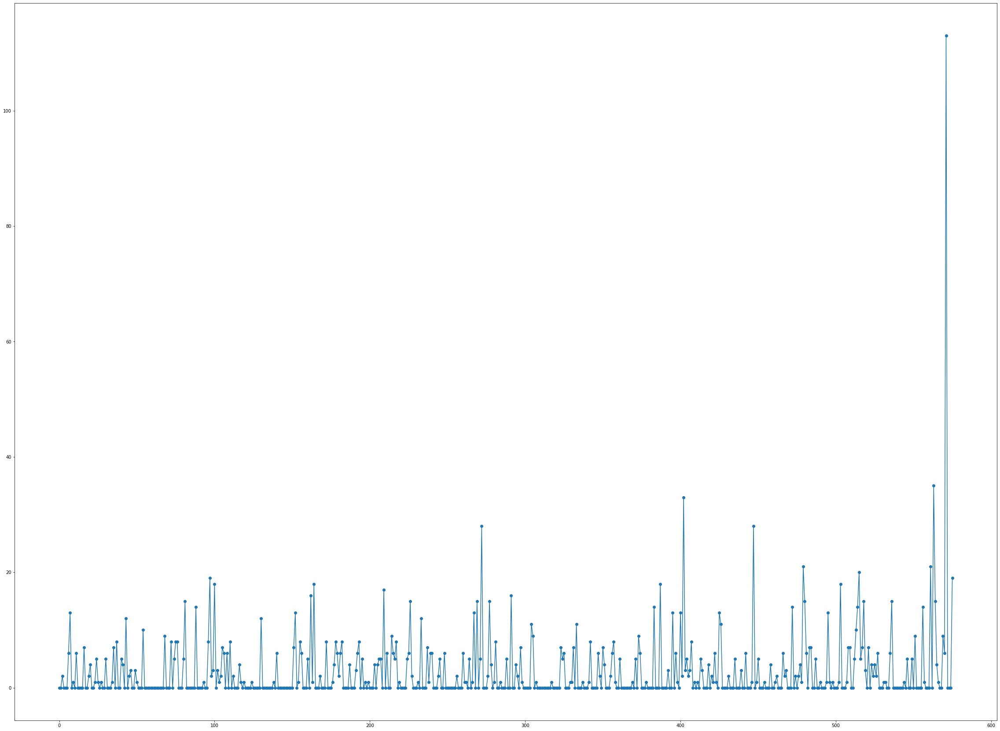

"COLLEGE OF FINE ARTS (CFA)"
The mean is ：3.671329
The standard div is ：6.516012


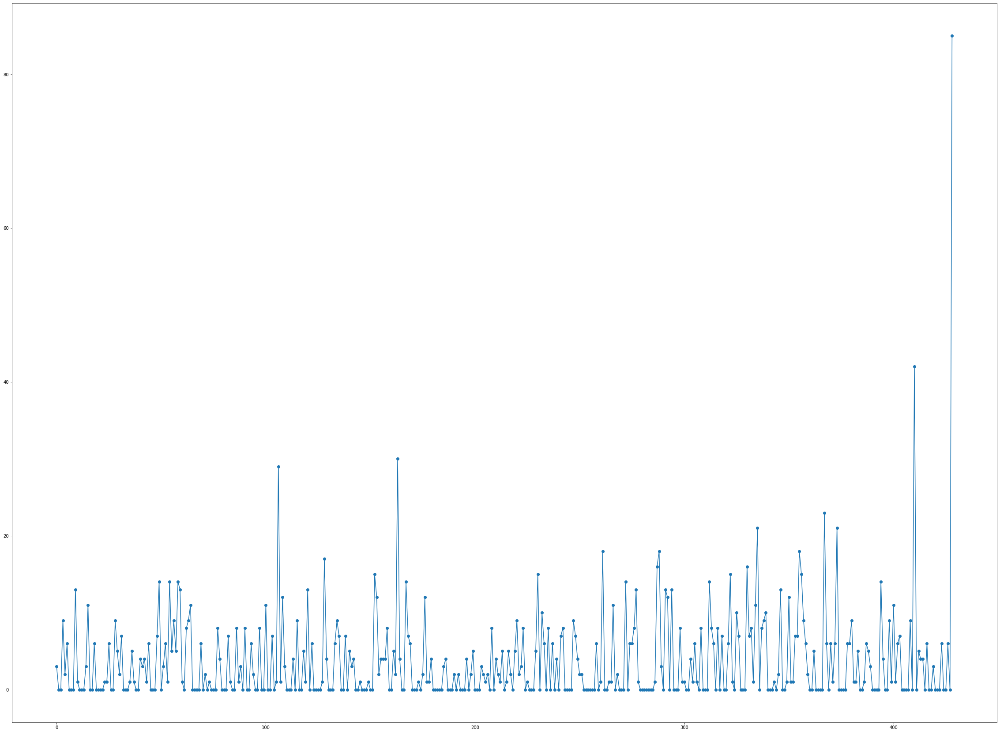

"SCHOOL OF LAW (LAW)"
The mean is ：3.678657
The standard div is ：5.322442


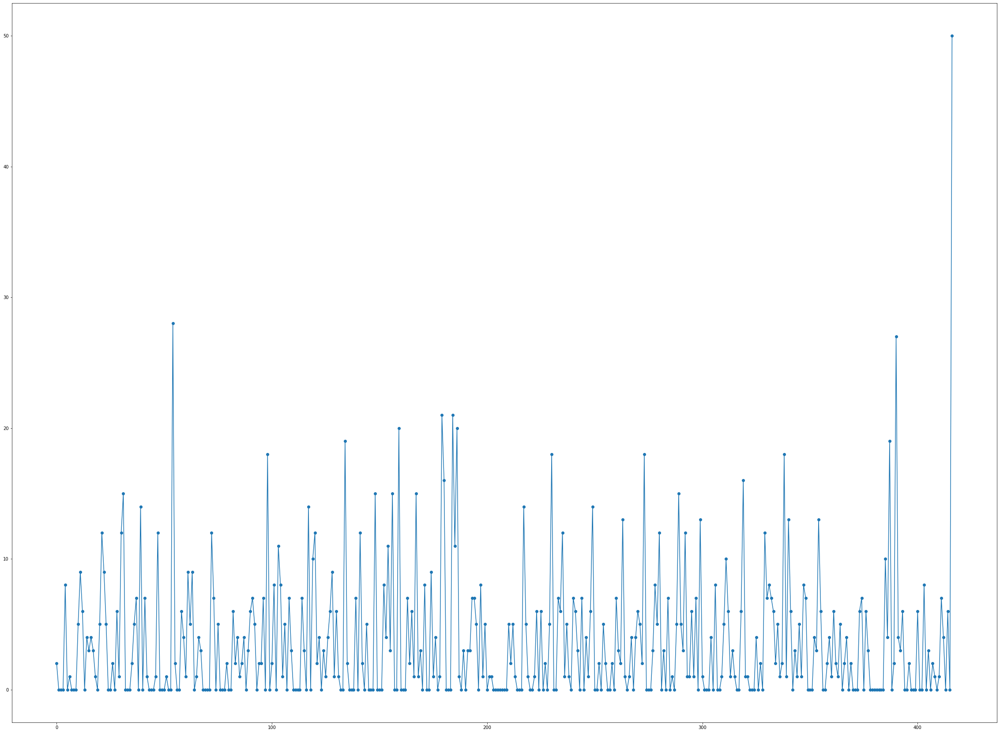

"SARGENT COLLEGE OF HEALTH & REHAB. SCI."
The mean is ：3.727047
The standard div is ：5.538042


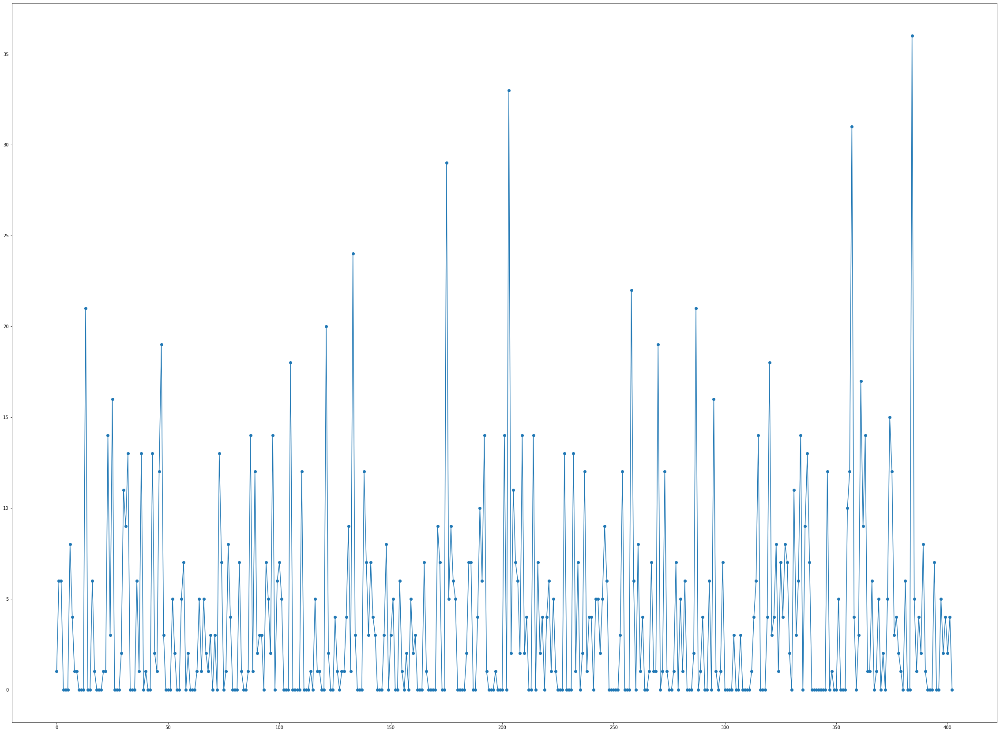

"QUESTROM SCHOOL OF BUSINESS (QST)"
The mean is ：4.343407
The standard div is ：7.697594


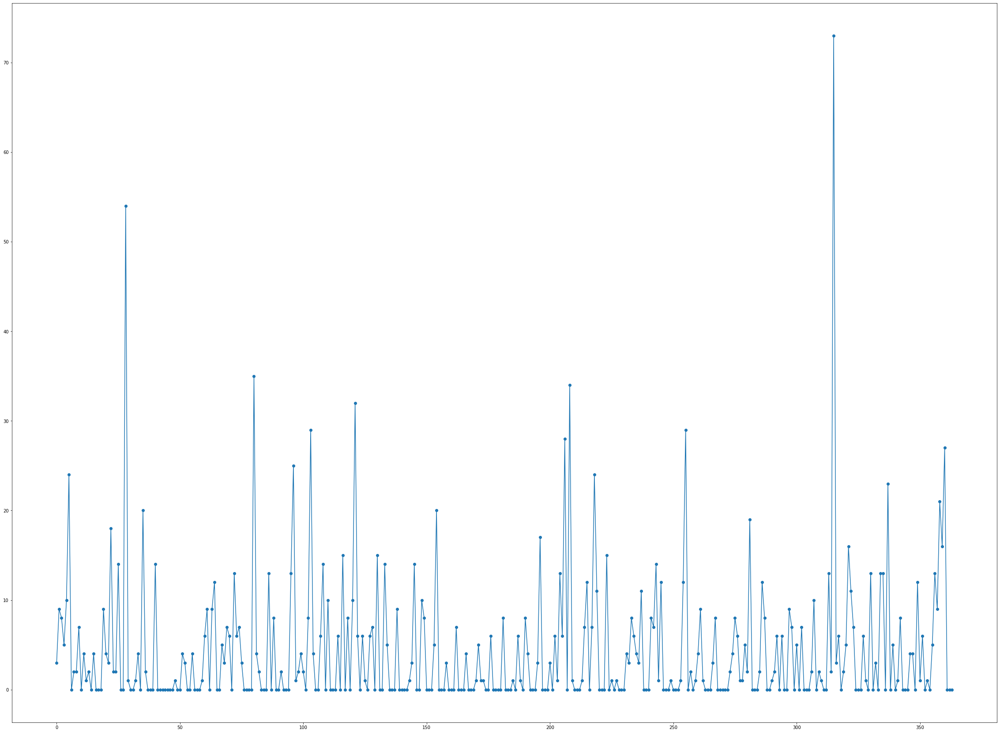

In [10]:
coffee_req['Unit name'].value_counts()

top10coffee=coffee_req['Unit name'].value_counts()[:10]._stat_axis.values.tolist()
top10toner=toner_req['Unit name'].value_counts()[:10]._stat_axis.values.tolist()
import matplotlib.pyplot as plt


def find_thecoffee_gap1(name):
  for h in name:
    print('"{0}"'.format(h))
    a1=coffee_req[coffee_req['Unit name'] == h]['PO Creation Date'].tolist()
    # print(a1)
    a1 = sorted(a1)

    
    a11 = []
    for i in range(len(a1)-1):
      a11.append((a1[i+1]-a1[i]).days)
    # print(a11)
    
    arr_mean=(np.mean(a11))
    arr_std=(np.std(a11))

    print("The mean is ：%f" % arr_mean)

    print("The standard div is ：%f" % arr_std)
    plt.plot(range(len(a11)), a11, '-o')
    plt.rcParams["figure.figsize"] = (40,30)
    plt.show()


def find_thetoner_gap1(name):
  for h in name:
    print('"{0}"'.format(h))
    a1=toner_req[toner_req['Unit name'] == h]['PO Creation Date'].tolist()
    # print(a1)
    a1 = sorted(a1)
    a11 = []
    for i in range(len(a1)-1):
      a11.append((a1[i+1]-a1[i]).days)
    arr_mean=(np.mean(a11))
    arr_std=(np.std(a11))

    print("The mean is ：%f" % arr_mean)

    print("The standard div is ：%f" % arr_std)
    plt.plot(range(len(a11)), a11, '-o')
    plt.rcParams["figure.figsize"] = (40,30)
    plt.show()



find_thecoffee_gap1(top10coffee)
print("Figure of toner is below")
find_thetoner_gap1(top10toner)


"GMT6520"
"HENRY M GOLDMAN SCH OF DENTAL MED (GSDM)"
The mean is ：6.388235
The standard div is ：8.479402
"SCHOOL OF MEDICINE (BUSM)"
The mean is ：14.770000
The standard div is ：15.306766
"COLLEGE OF ARTS AND SCIS (CAS)"
The mean is ：20.208333
The standard div is ：25.827385
"GENERAL ED SUPPORT & ACADEMIC INITIATIVS"
The mean is ：15.423077
The standard div is ：15.905788
"ADMINISTRATIVE SERVICES"
The mean is ：10.953020
The standard div is ：12.672613


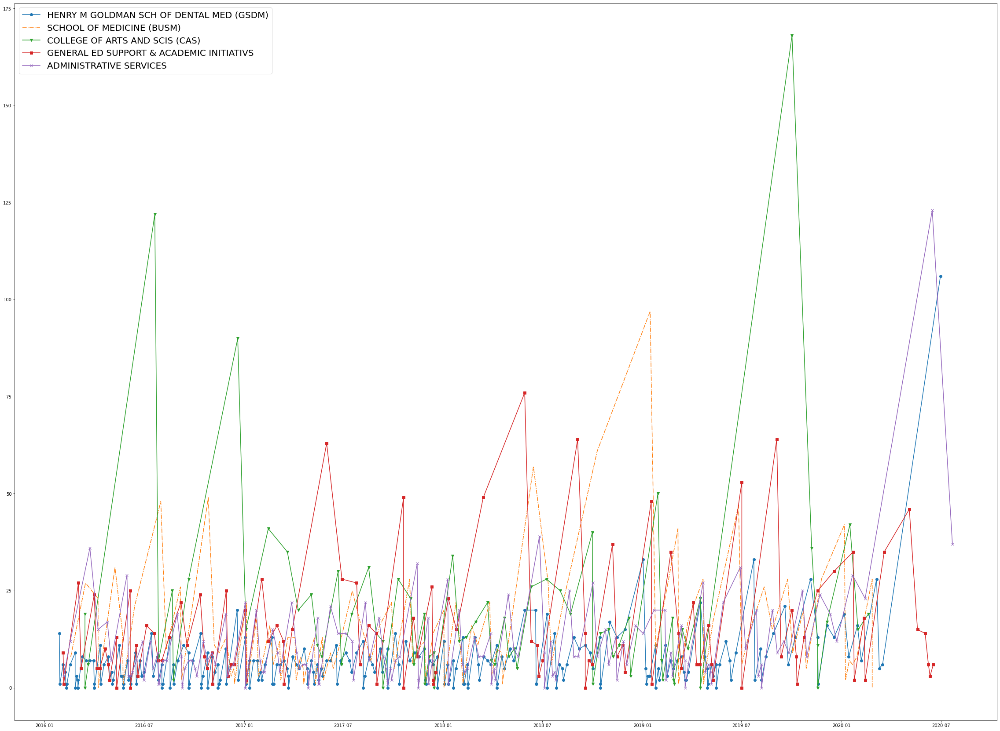

"GMT4061"
"HENRY M GOLDMAN SCH OF DENTAL MED (GSDM)"
The mean is ：9.078788
The standard div is ：12.439423
"SCHOOL OF MEDICINE (BUSM)"
The mean is ：12.571429
The standard div is ：9.750304
"COLLEGE OF ARTS AND SCIS (CAS)"
The mean is ：12.944444
The standard div is ：15.865659
"GENERAL ED SUPPORT & ACADEMIC INITIATIVS"
The mean is ：7.597156
The standard div is ：6.700342
"ADMINISTRATIVE SERVICES"
The mean is ：18.592593
The standard div is ：17.096515


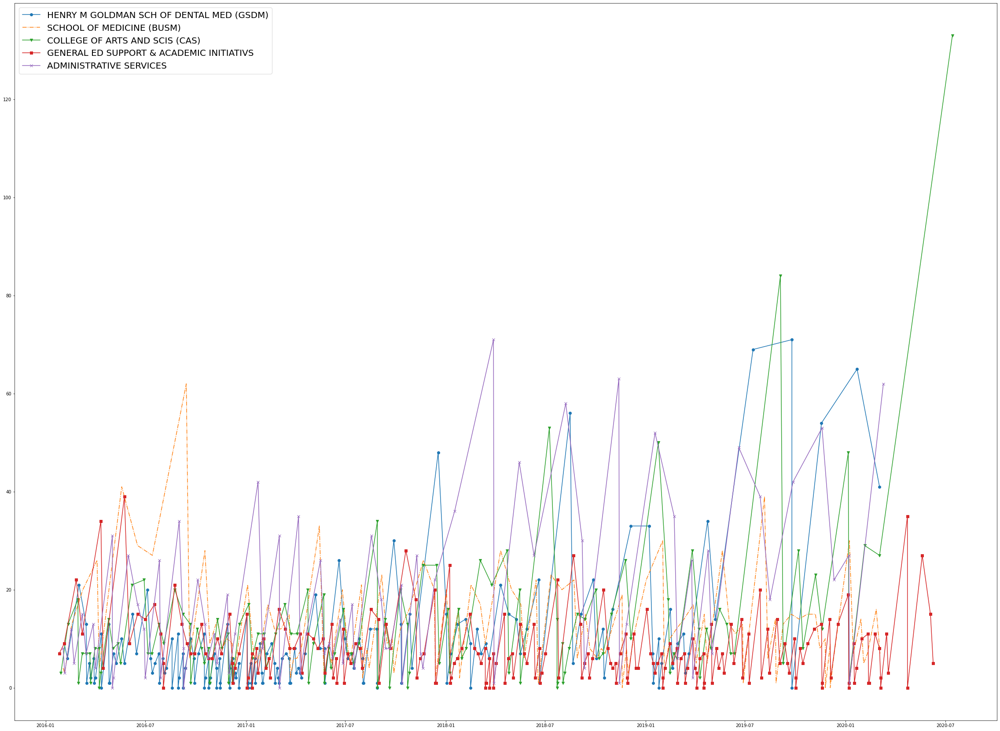

"GMT6663"
"HENRY M GOLDMAN SCH OF DENTAL MED (GSDM)"
The mean is ：6.081301
The standard div is ：5.267778
"SCHOOL OF MEDICINE (BUSM)"
The mean is ：23.876923
The standard div is ：42.026917
"COLLEGE OF ARTS AND SCIS (CAS)"
The mean is ：20.602740
The standard div is ：24.937038
"GENERAL ED SUPPORT & ACADEMIC INITIATIVS"
The mean is ：10.550000
The standard div is ：11.150480
"ADMINISTRATIVE SERVICES"
The mean is ：25.625000
The standard div is ：22.595284


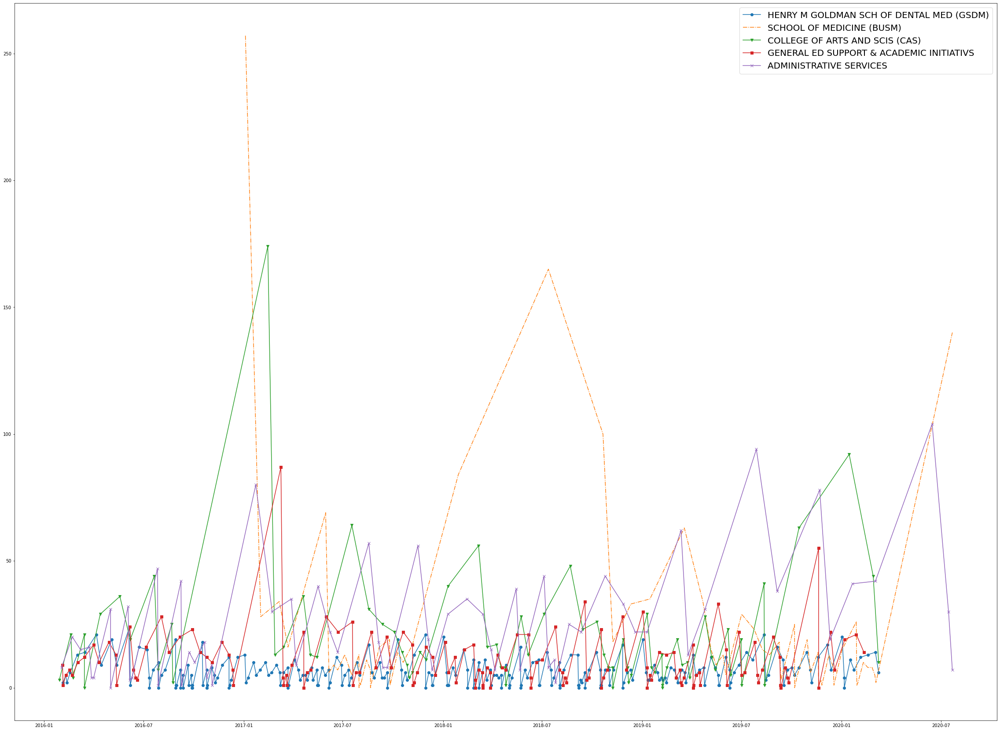

"NES35110BX"
"HENRY M GOLDMAN SCH OF DENTAL MED (GSDM)"
The mean is ：8.391753
The standard div is ：8.527768
"SCHOOL OF MEDICINE (BUSM)"
The mean is ：14.482143
The standard div is ：17.940866
"COLLEGE OF ARTS AND SCIS (CAS)"
The mean is ：17.786517
The standard div is ：19.729332
"GENERAL ED SUPPORT & ACADEMIC INITIATIVS"
The mean is ：10.203822
The standard div is ：9.004414
"ADMINISTRATIVE SERVICES"
The mean is ：47.735294
The standard div is ：52.144770


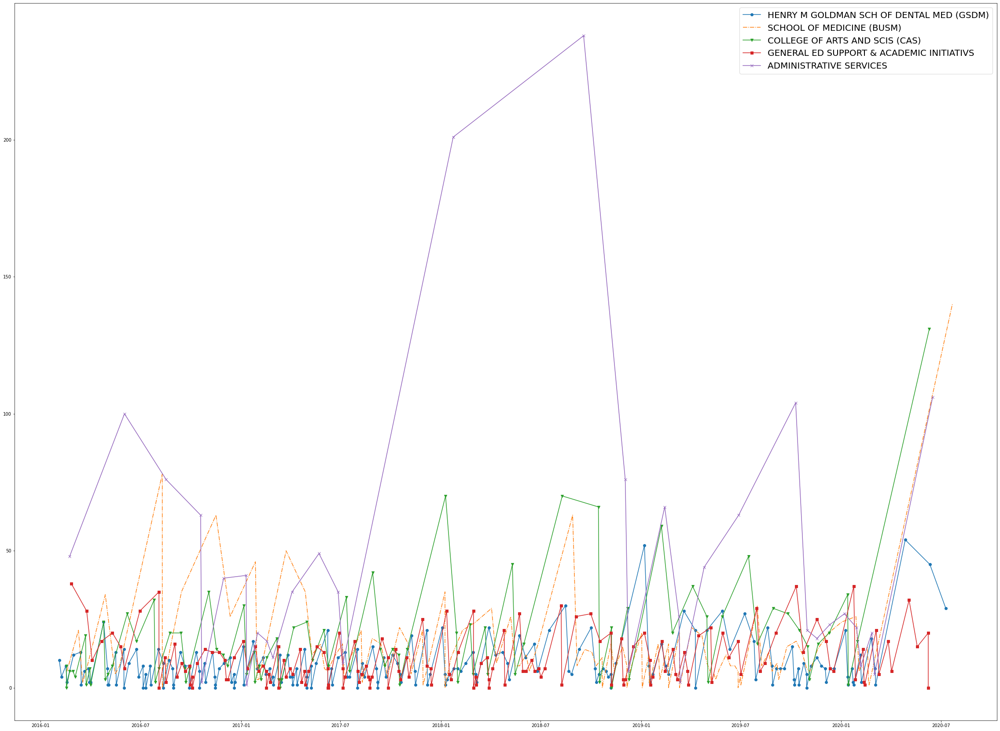

"GMT6732"
"HENRY M GOLDMAN SCH OF DENTAL MED (GSDM)"
The mean is ：29.836735
The standard div is ：36.744205
"SCHOOL OF MEDICINE (BUSM)"
The mean is ：16.340000
The standard div is ：18.320055
"COLLEGE OF ARTS AND SCIS (CAS)"
The mean is ：37.333333
The standard div is ：24.669439
"GENERAL ED SUPPORT & ACADEMIC INITIATIVS"
The mean is ：68.086957
The standard div is ：47.158302
"ADMINISTRATIVE SERVICES"
The mean is ：37.976190
The standard div is ：33.357007


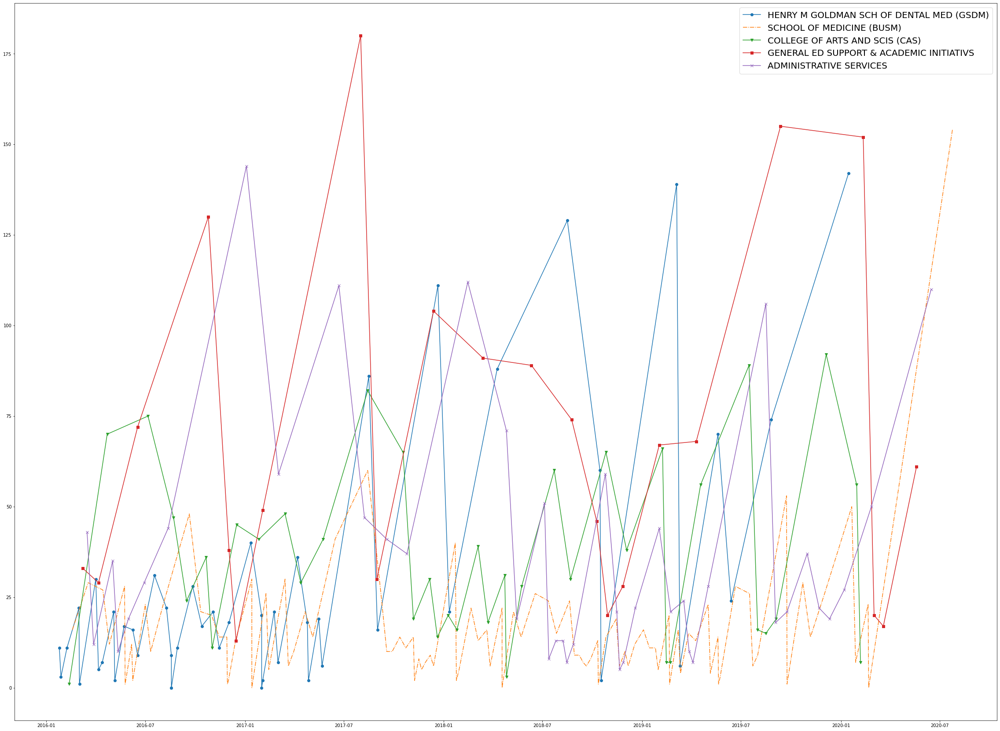

"HEWCE505A"
"SCHOOL OF MEDICINE (BUSM)"
The mean is ：46.906250
The standard div is ：55.370547
"COLLEGE OF ARTS AND SCIS (CAS)"
The mean is ：41.750000
The standard div is ：35.896746
"HENRY M GOLDMAN SCH OF DENTAL MED (GSDM)"
The mean is ：14.201754
The standard div is ：16.718086
"GENERAL ED SUPPORT & ACADEMIC INITIATIVS"
The mean is ：nan
The standard div is ：nan
"SCHOOL OF PUBLIC HEALTH (SPH)"
The mean is ：220.666667
The standard div is ：232.811559


/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:234: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:195: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:226: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


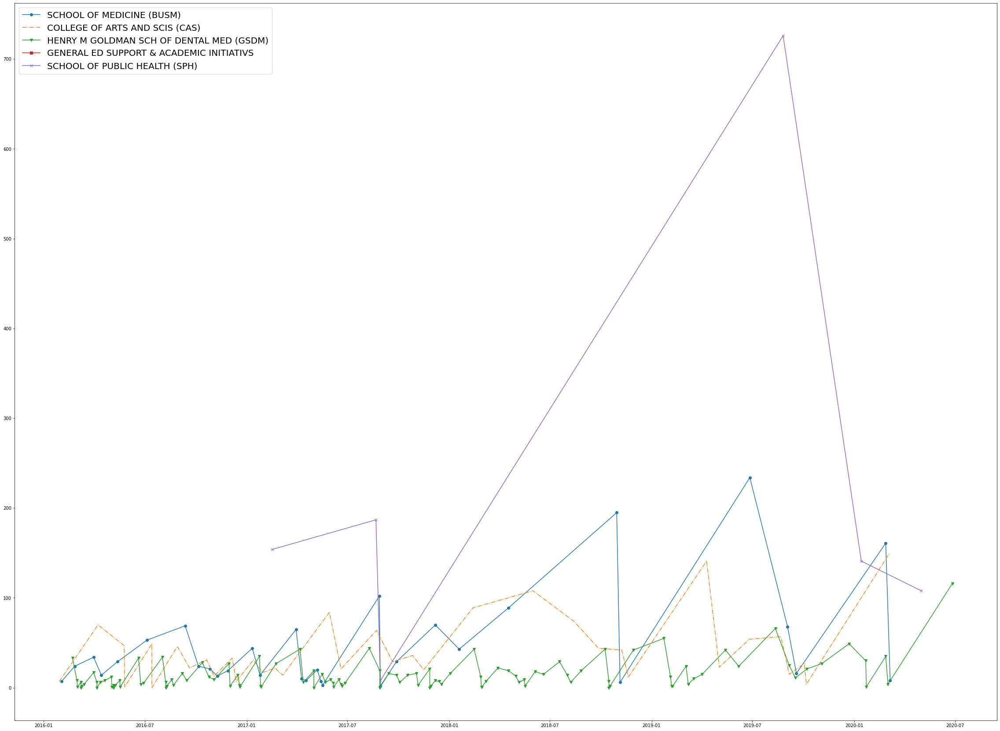

"HEWCN045AN"
"SCHOOL OF MEDICINE (BUSM)"
The mean is ：27.169492
The standard div is ：28.006145
"COLLEGE OF ARTS AND SCIS (CAS)"
The mean is ：96.133333
The standard div is ：85.192227
"HENRY M GOLDMAN SCH OF DENTAL MED (GSDM)"
The mean is ：23.174603
The standard div is ：19.579338
"GENERAL ED SUPPORT & ACADEMIC INITIATIVS"
The mean is ：60.833333
The standard div is ：43.024864
"SCHOOL OF PUBLIC HEALTH (SPH)"
The mean is ：174.750000
The standard div is ：178.737062


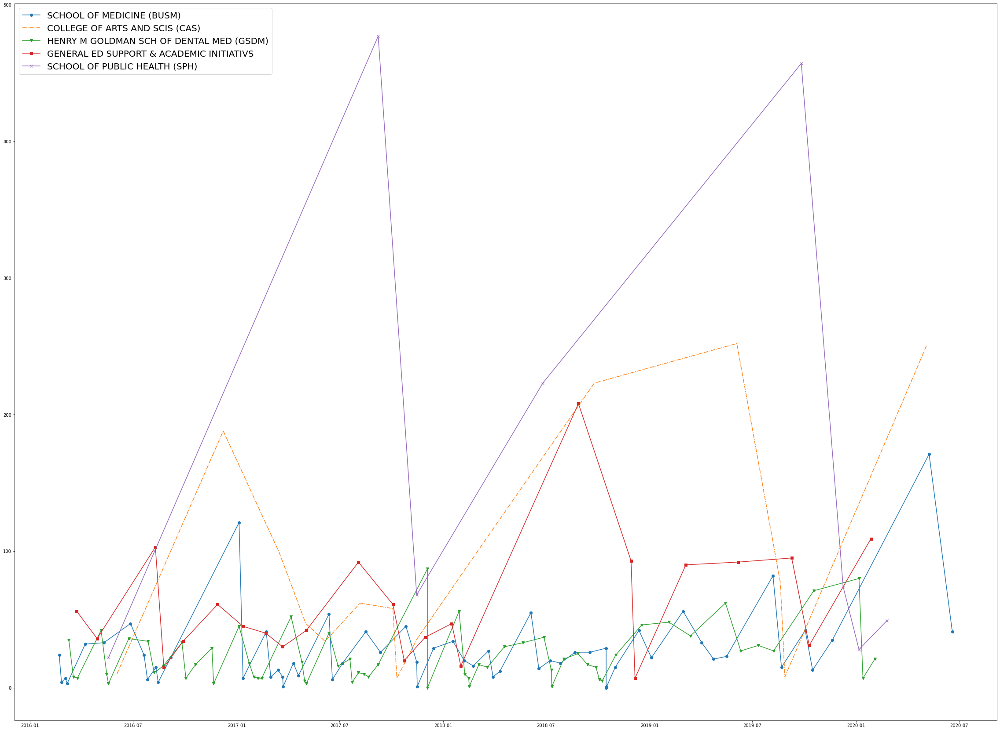

"HEWCR314FN"
"SCHOOL OF MEDICINE (BUSM)"
The mean is ：34.239130
The standard div is ：38.382052
"COLLEGE OF ARTS AND SCIS (CAS)"
The mean is ：37.416667
The standard div is ：35.916087
"HENRY M GOLDMAN SCH OF DENTAL MED (GSDM)"
The mean is ：25.568966
The standard div is ：24.475260
"GENERAL ED SUPPORT & ACADEMIC INITIATIVS"
The mean is ：81.105263
The standard div is ：57.622999
"SCHOOL OF PUBLIC HEALTH (SPH)"
The mean is ：196.571429
The standard div is ：215.741815


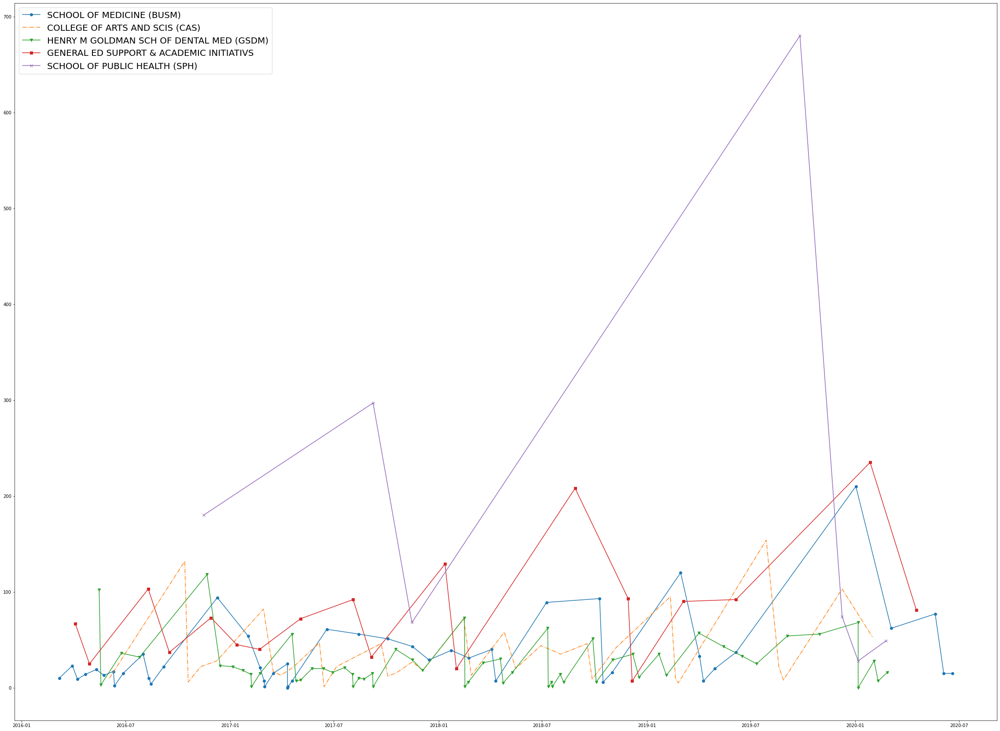

"DXE2342PATH"
"SCHOOL OF MEDICINE (BUSM)"
The mean is ：80.117647
The standard div is ：89.631850
"COLLEGE OF ARTS AND SCIS (CAS)"
The mean is ：175.625000
The standard div is ：114.646127
"HENRY M GOLDMAN SCH OF DENTAL MED (GSDM)"
The mean is ：57.727273
The standard div is ：27.914125
"GENERAL ED SUPPORT & ACADEMIC INITIATIVS"
The mean is ：204.125000
The standard div is ：167.157439
"SCHOOL OF PUBLIC HEALTH (SPH)"
The mean is ：194.500000
The standard div is ：129.600347


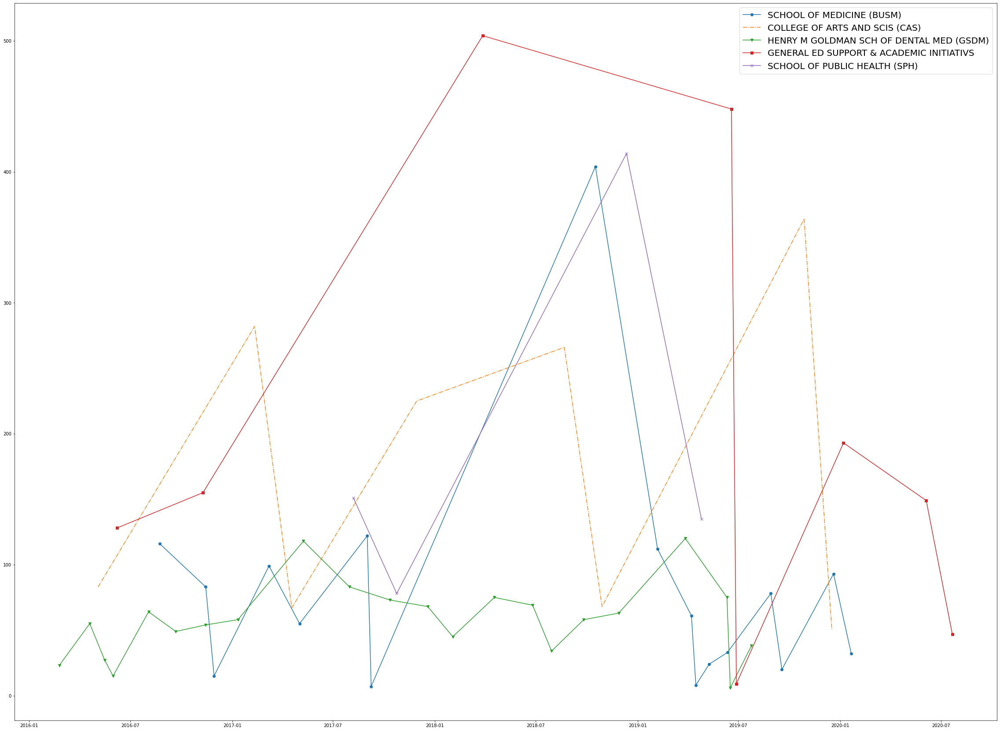

"HEWCE410A"
"SCHOOL OF MEDICINE (BUSM)"
The mean is ：22.136986
The standard div is ：31.812514
"COLLEGE OF ARTS AND SCIS (CAS)"
The mean is ：49.593750
The standard div is ：49.588847
"HENRY M GOLDMAN SCH OF DENTAL MED (GSDM)"
The mean is ：88.166667
The standard div is ：96.373838
"GENERAL ED SUPPORT & ACADEMIC INITIATIVS"
The mean is ：67.684211
The standard div is ：78.786221
"SCHOOL OF PUBLIC HEALTH (SPH)"
The mean is ：45.060606
The standard div is ：53.689872


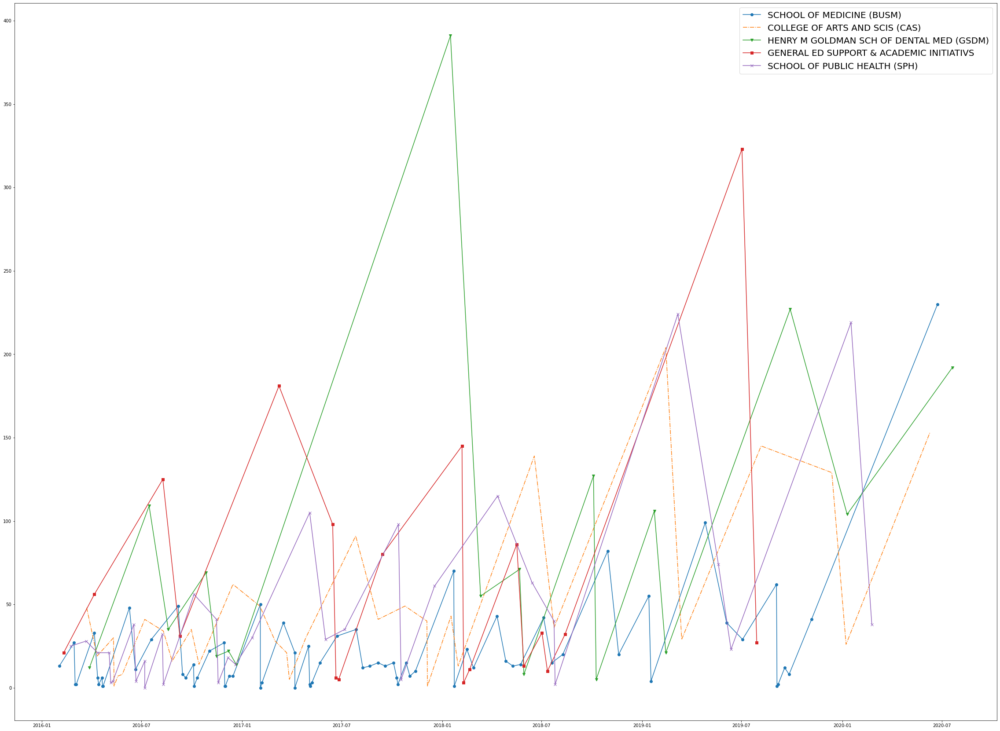

In [26]:

top10coffee=coffee_req['upper part'].value_counts()[:5]._stat_axis.values.tolist()
top10toner=toner_req['upper part'].value_counts()[:5]._stat_axis.values.tolist()

top10dep=coffee_req['Unit name'].value_counts()[:5]._stat_axis.values.tolist()
top10dep2=toner_req['Unit name'].value_counts()[:5]._stat_axis.values.tolist()

mark=['-o','-.','-v','-s','-x']

import matplotlib.pyplot as plt


def find_thecoffee_gap2(name,dep):
  for h in name:
    print('"{0}"'.format(h))
    for l in range(len(dep)): 
      print('"{0}"'.format(dep[l]))
      temp = coffee_req[coffee_req['Unit name'] == dep[l]]
      a1=temp[temp['Product P/N (Vendor)'] == h]['PO Creation Date'].tolist()
      # print(a1)
      a1 = sorted(a1)

    
      a11 = []
      for i in range(len(a1)-1):
        a11.append((a1[i+1]-a1[i]).days)
      # print(a11)
    
      arr_mean=(np.mean(a11))
      arr_std=(np.std(a11))

      print("The mean is ：%f" % arr_mean)

      print("The standard div is ：%f" % arr_std)
      plt.plot(a1[1:], a11, mark[l])
      plt.rcParams["figure.figsize"] = (40,30)
    plt.legend(dep,prop={'size': 20})
    plt.show()



def find_thetoner_gap2(name,dep):
  for h in name:
    print('"{0}"'.format(h))
    for l in range(len(dep)): 
      print('"{0}"'.format(dep[l]))
      temp = toner_req[toner_req['Unit name'] == dep[l]]
      a1=temp[temp['Product P/N (Vendor)'] == h]['PO Creation Date'].tolist()
      # print(a1)
      a1 = sorted(a1)

    
      a11 = []
      for i in range(len(a1)-1):
        a11.append((a1[i+1]-a1[i]).days)
      # print(a11)
    
      arr_mean=(np.mean(a11))
      arr_std=(np.std(a11))

      print("The mean is ：%f" % arr_mean)

      print("The standard div is ：%f" % arr_std)
      plt.plot(a1[1:], a11, mark[l])
      plt.rcParams["figure.figsize"] = (40,30)
    plt.legend(dep,prop={'size': 20})
    plt.show()



find_thecoffee_gap2(top10coffee,top10dep)
find_thetoner_gap2(top10toner,top10dep2)